## This Note Book is for Exploratory Data Analysis for Santander Competition

Notes:
 - Half of the data in test dataset are sythetic.
 - Synthetic data's feature are sampled from those existed unique value, which means for synthetic data, all the features are duplicated (no unique feature values).
 - Training data also has some sythetic data, but it generated by a different way (adding noises), which explain why it has more unique values for all those features.
 - The ultimate goal is to find real training data for training.
 - The distribution of intersection between train&test, and the distribution of difference shows that the real distribution has been hided from those fake distributions.
 
 - **So the strategy is to find the real data in training data which share the distribution of test data.**

## Load Packages

In [12]:
import numpy as np # linear algebra
import pandas as pd 
# Any results you write to the current directory are saved as output.
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score

import lightgbm as lgb
from tqdm import tqdm_notebook
import scipy.stats
from scipy.stats import kurtosis
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import RandomOverSampler
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

plt.style.use('seaborn')
sns.set(font_scale=1)

## Load Data

In [8]:
# Load the data and set random seed
random_state = 42
np.random.seed(random_state)
df_train = pd.read_pickle('./train.pkl')
df_test = pd.read_pickle('./test.pkl')

In [9]:
# Define Features
feature = [col for col in df_train.columns if col not in ['ID_code', 'target']]

In [10]:
# Split features and labels
train_X = df_train[feature]
test_X = df_test[feature]
y = df_train['target']

In [11]:
# Split label=0 and label=1 data
train_X_0 = train_X[df_train['target']==0]
train_X_1 = train_X[df_train['target']==1]
# corr_0 = train_0.corr()
# corr_1 = train_1.corr()
# corr_test = test_X.corr()

In [14]:
# Variance Analysis
train_var = train_X.var(axis=0)
test_var = test_X.var(axis=0)

In [16]:
# Load real test data index
public = np.load('public_LB.npy')
private = np.load('private_LB.npy')

In [17]:
real_idx = np.hstack([public,private])
real_test = test_X.iloc[real_idx,:]

## Analysis

Take a look at the unique value numbers

In [26]:
train_unique = train_X.nunique()
test_unique = test_X.nunique()
train_unique_0 = train_X[df_train['target']==0].nunique()
train_unique_1 = train_X[df_train['target']==1].nunique()

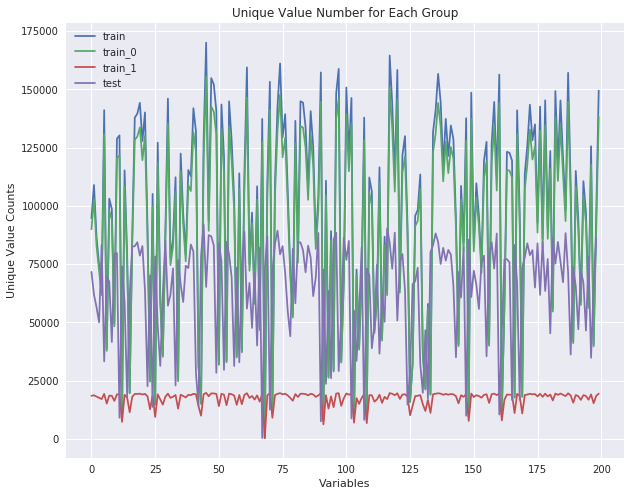

In [31]:
plt.figure(figsize=(10,8))
plt.title("Unique Value Number for Each Group")
plt.xlabel("Variables")
plt.ylabel("Unique Value Counts")
plt.plot(train_unique.values, label = 'train')
plt.plot(train_unique_0.values, label = 'train_0')
plt.plot(train_unique_1.values, label = 'train_1')
plt.plot(test_unique.values[1:],label = 'test')
plt.legend()

One interesting thing is, there is a significant difference for the unique value numbers of each variable, between training data and test data.

So I guessed the competition hose added some noises in the original training data. So if the variable value are unique, it is highly possible this variable is sythetic (added noise from the original data), so we need to tell this information to the model. Before doing that, let's take a look at the distribution of different groups of data: 
 - Test data
 - Training data
 - Training data that variable values appear in test data
 - Training data that variable values do not appear in test data

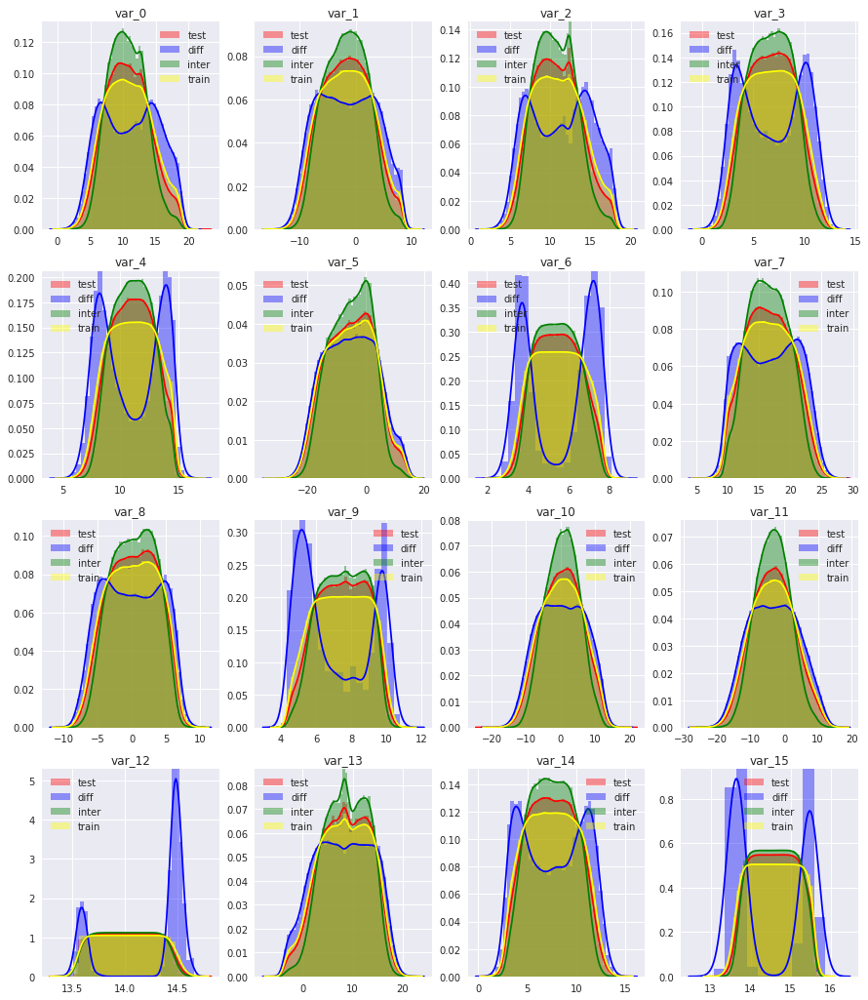

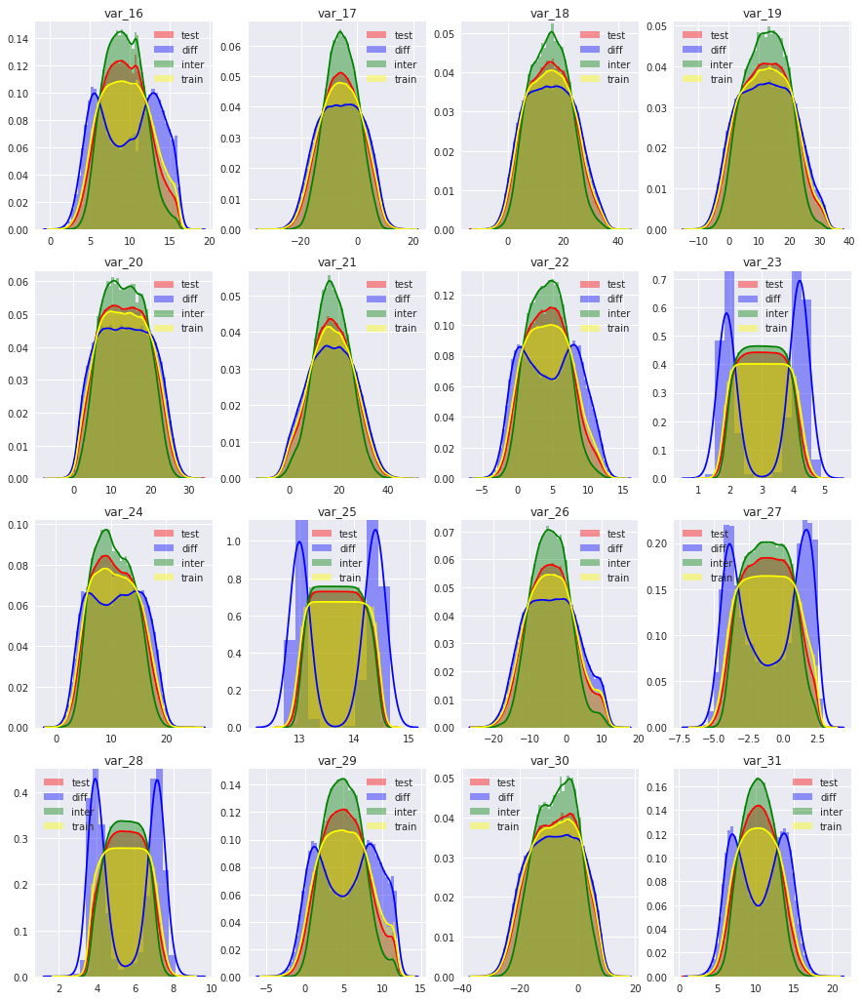

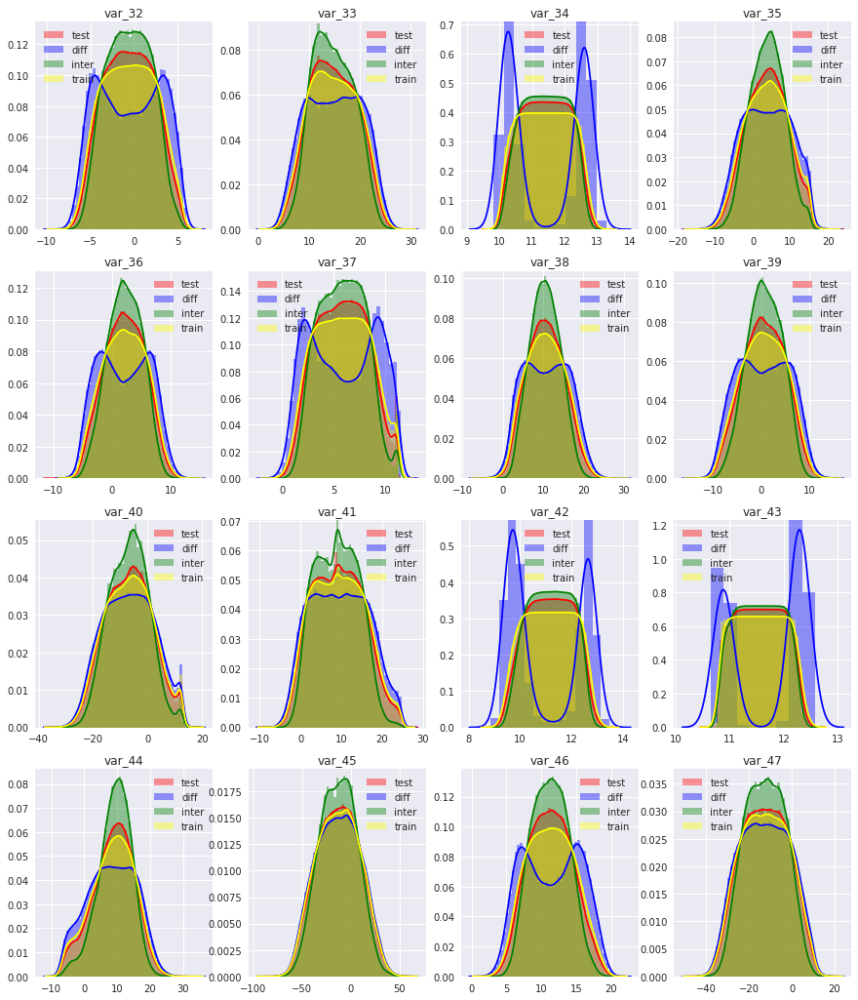

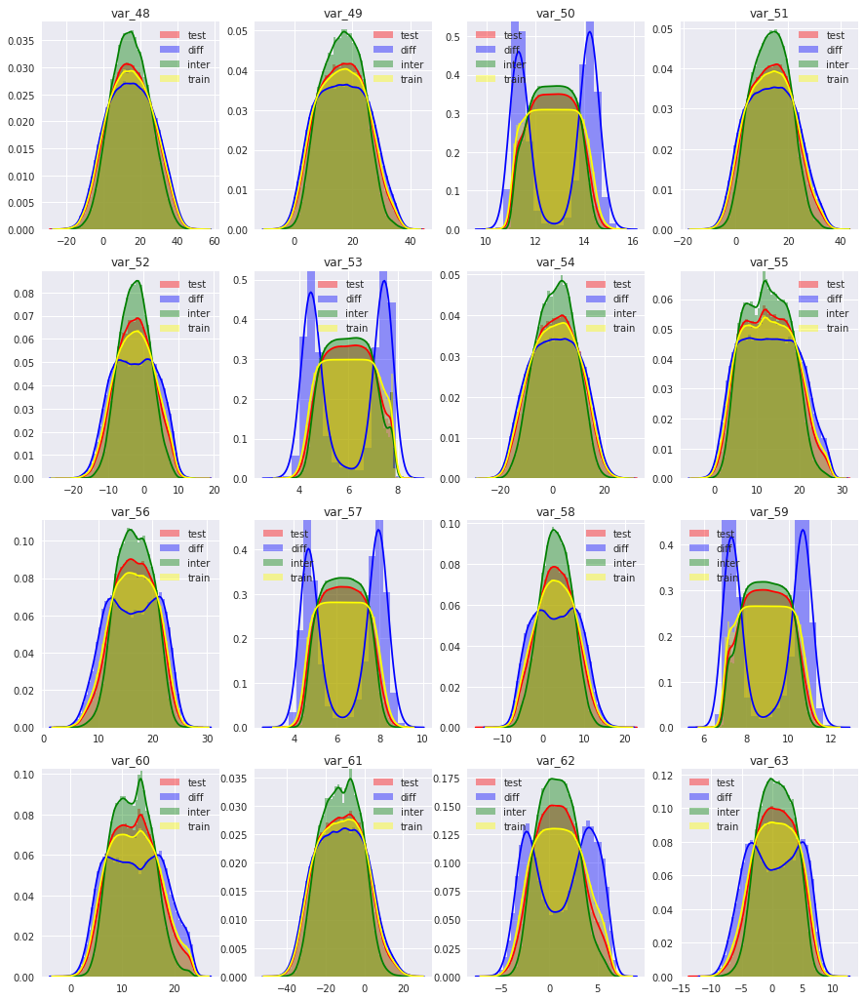

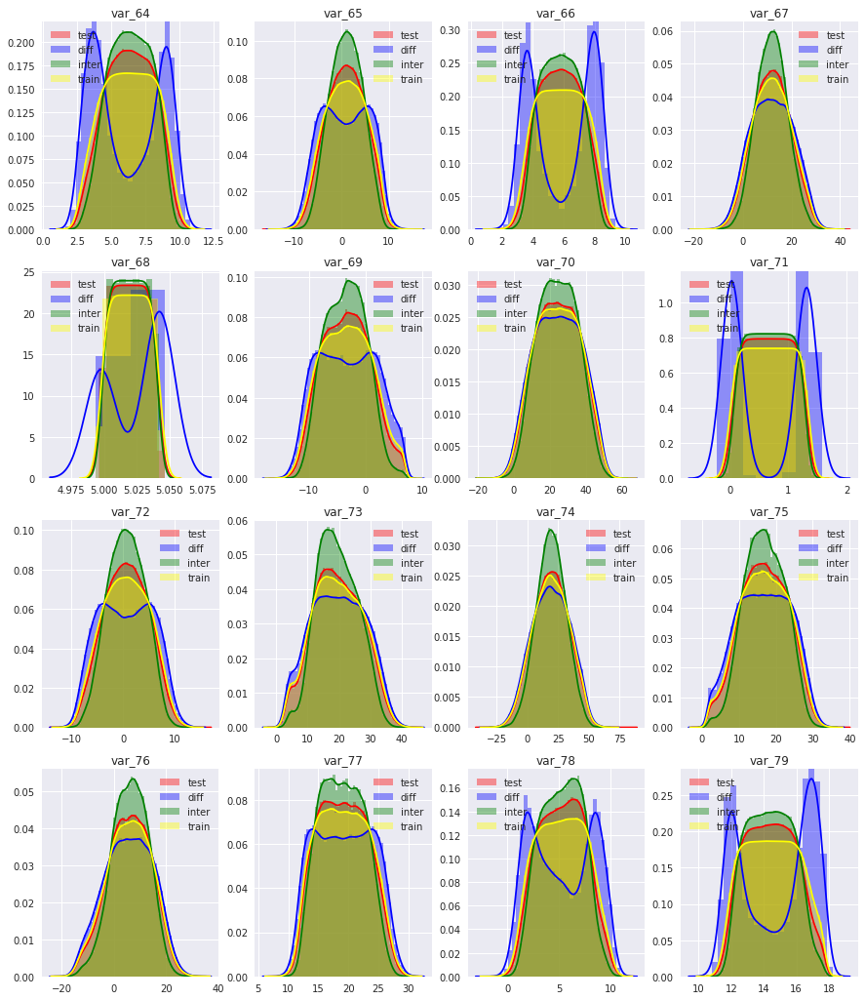

...

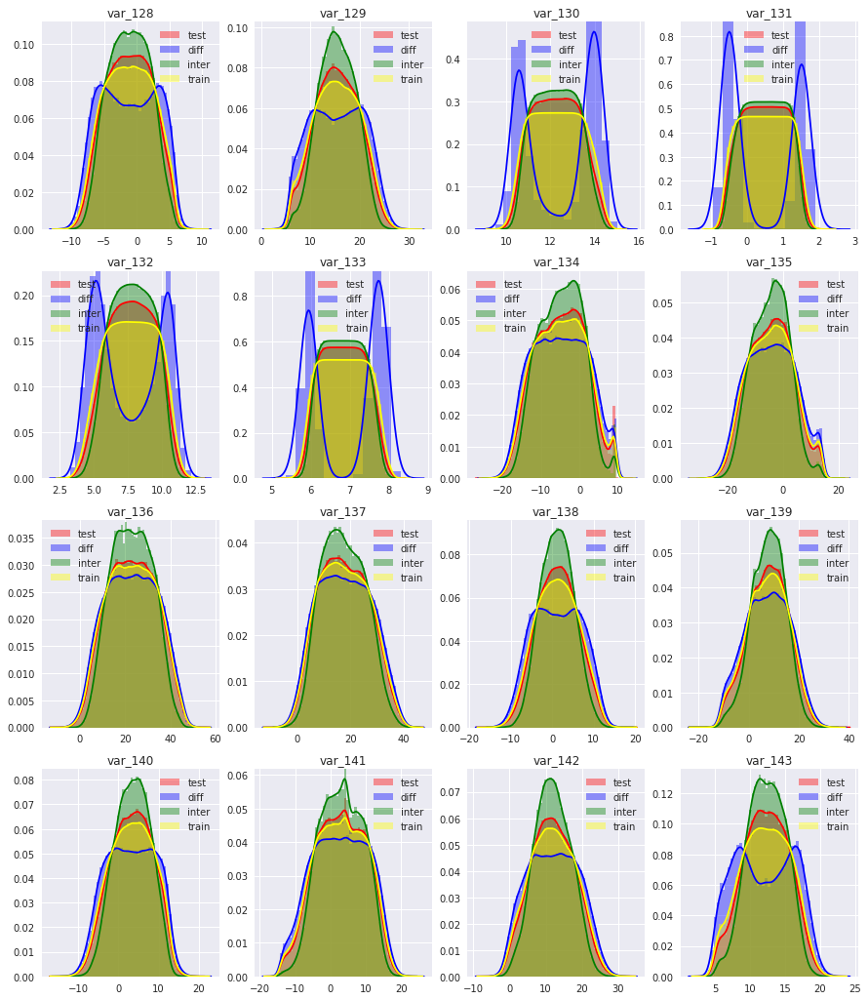

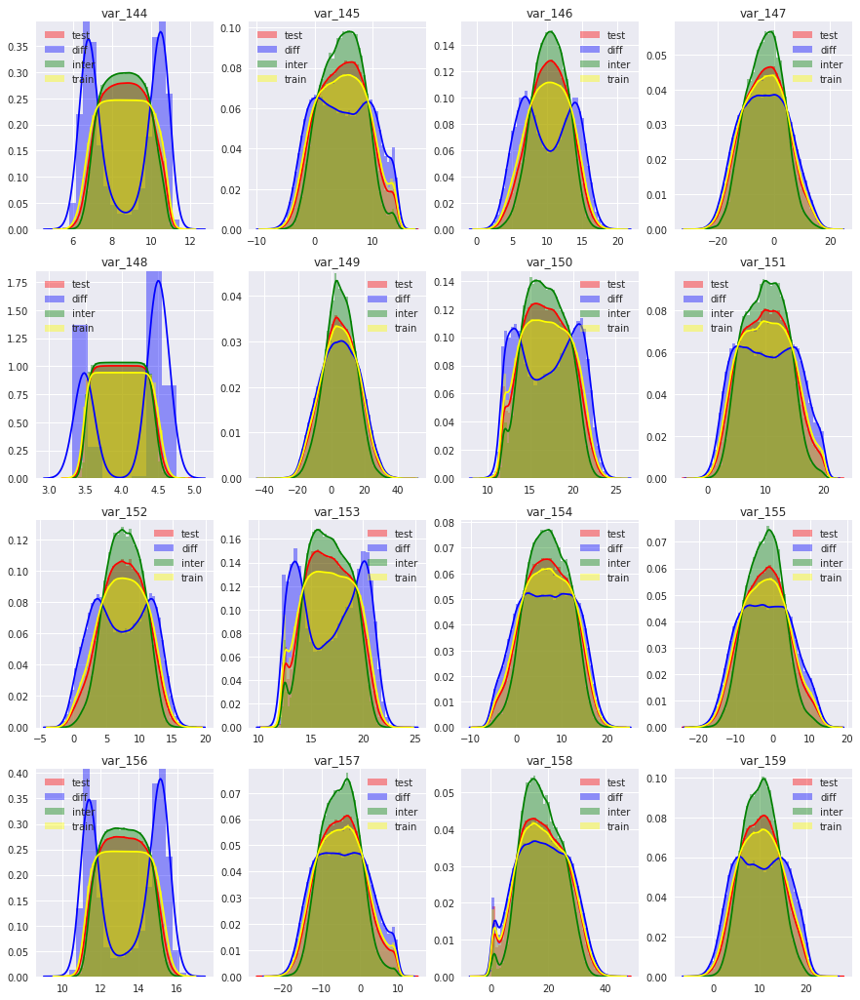

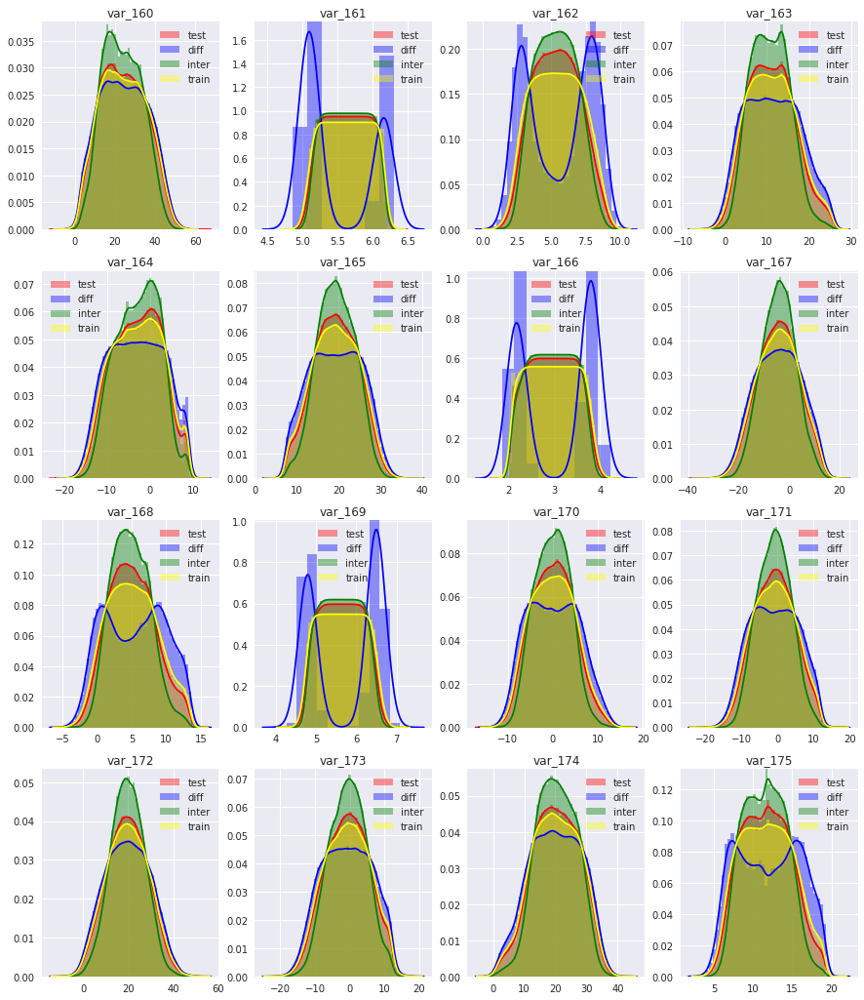

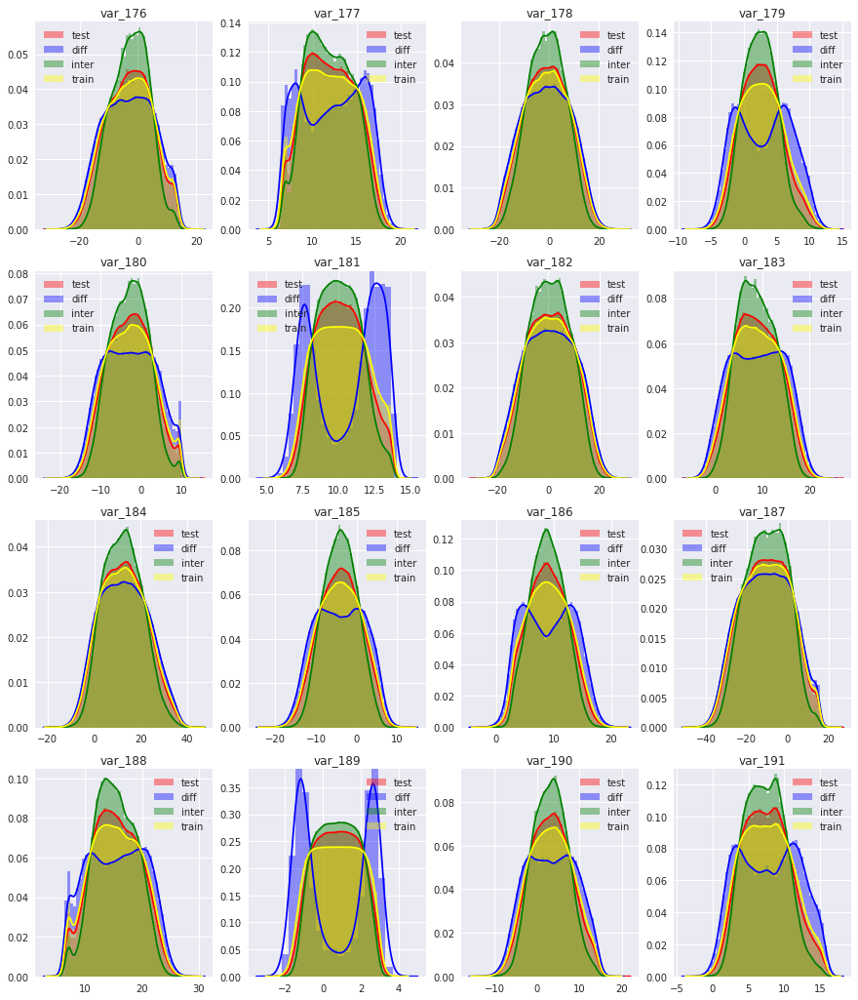

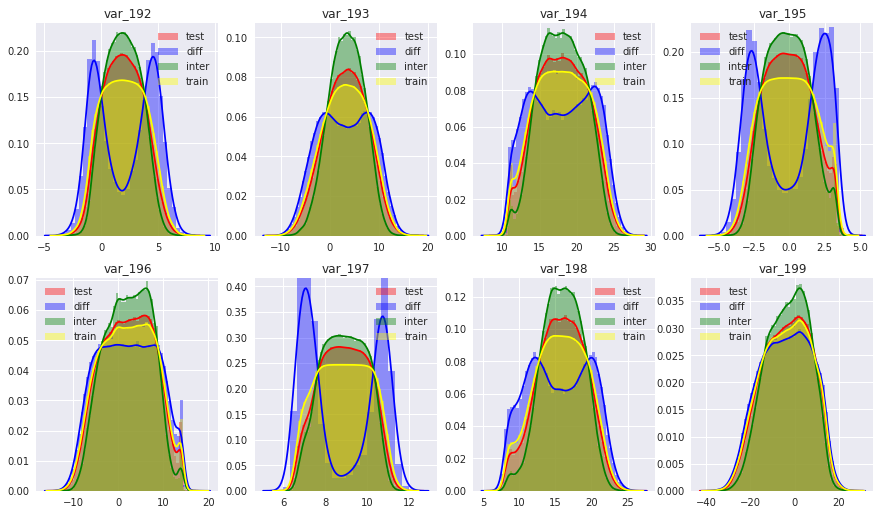

In [22]:
#Plot the distribution of different groups of data, test_data are full original data
for j in range(13):
    plt.figure(figsize=(15,18))
    for i in range(16):
        if i+j*16>199: continue
        plt.subplot(4, 4, i+1)
        train_0 = list(set(train_X['var_'+str(i+j*16)]))
        test_0 = list(set(test_X['var_'+str(i+j*16)]))
        var_0_diff = list(set(train_X['var_'+str(i+j*16)])-set(test_X['var_'+str(i+j*16)]))
        var_0_inter = list(set(train_X['var_'+str(i+j*16)]).intersection(set(test_X['var_'+str(i+j*16)])))
        sns.distplot(test_0, label = 'test', color='red')
        sns.distplot(var_0_diff, label = 'diff', color='blue')
        sns.distplot(var_0_inter, label = 'inter', color='green')
        sns.distplot(train_0, label = 'train', color='yellow')
        plt.legend()
        plt.title('var_'+str(i+j*16))
        plt.xlabel('')
    plt.show()

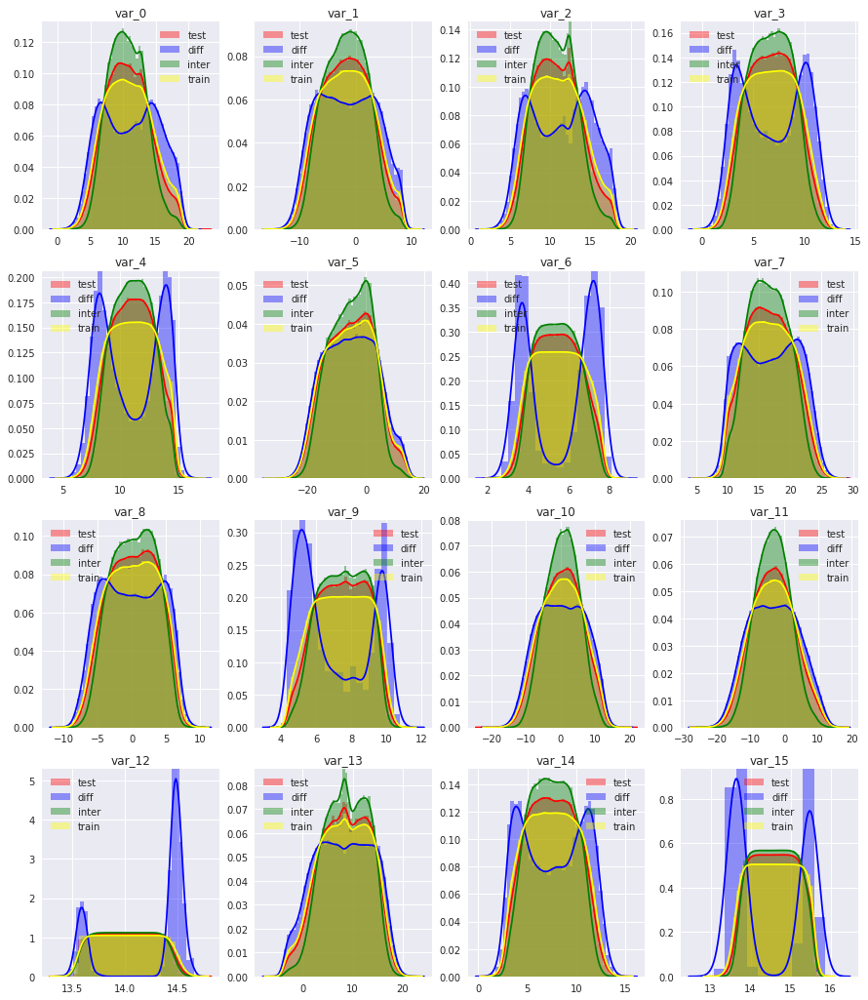

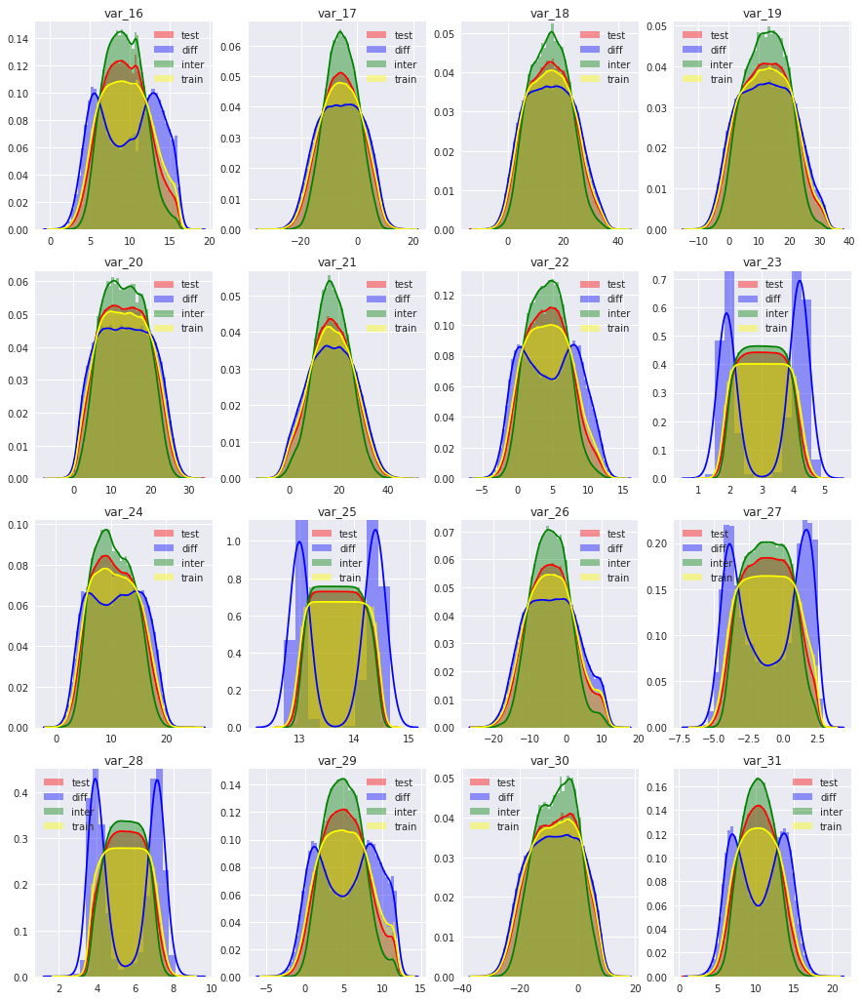

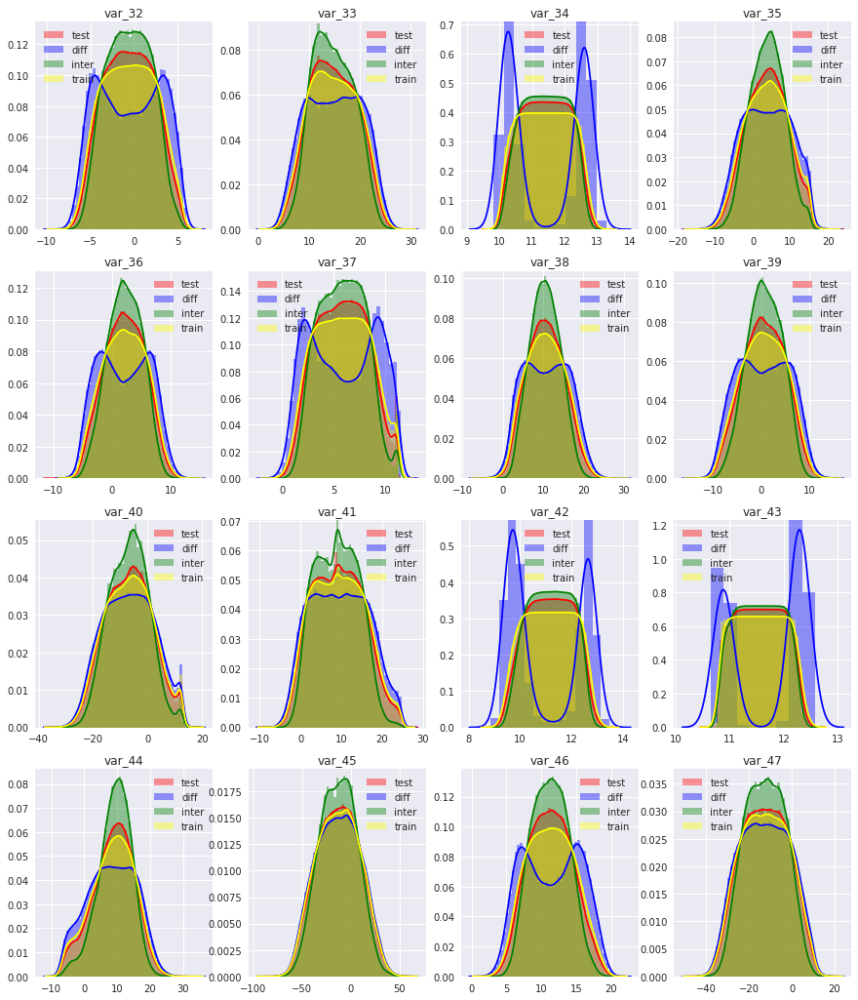

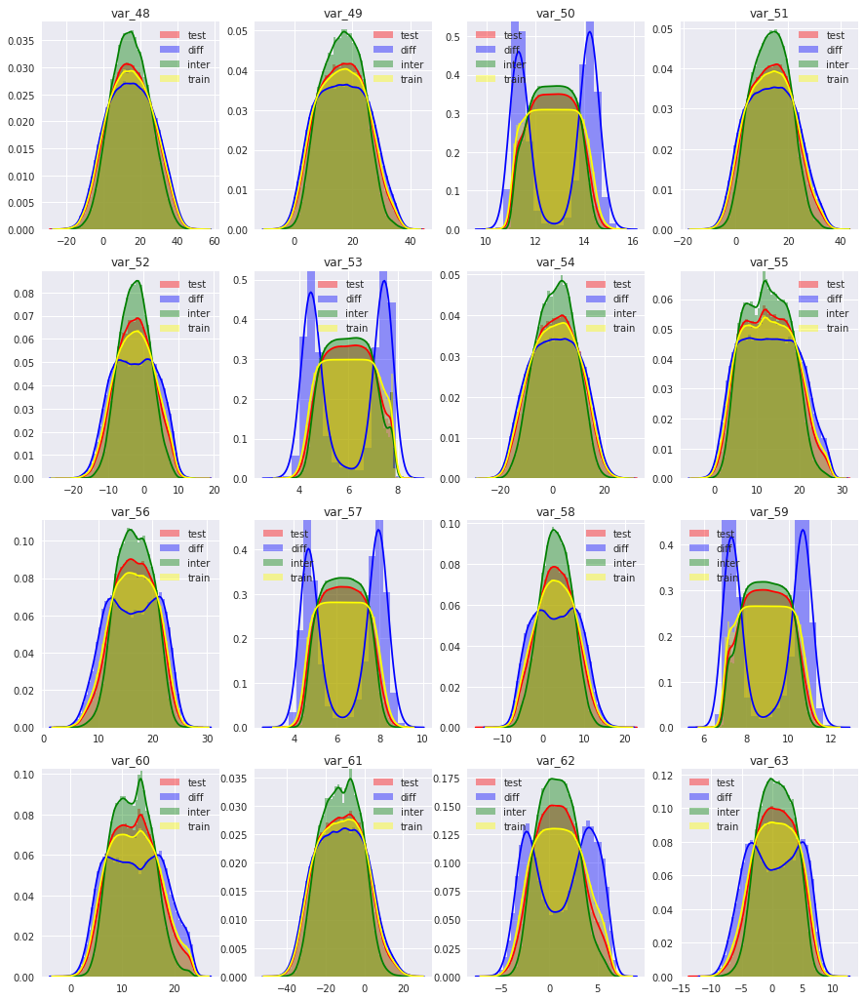

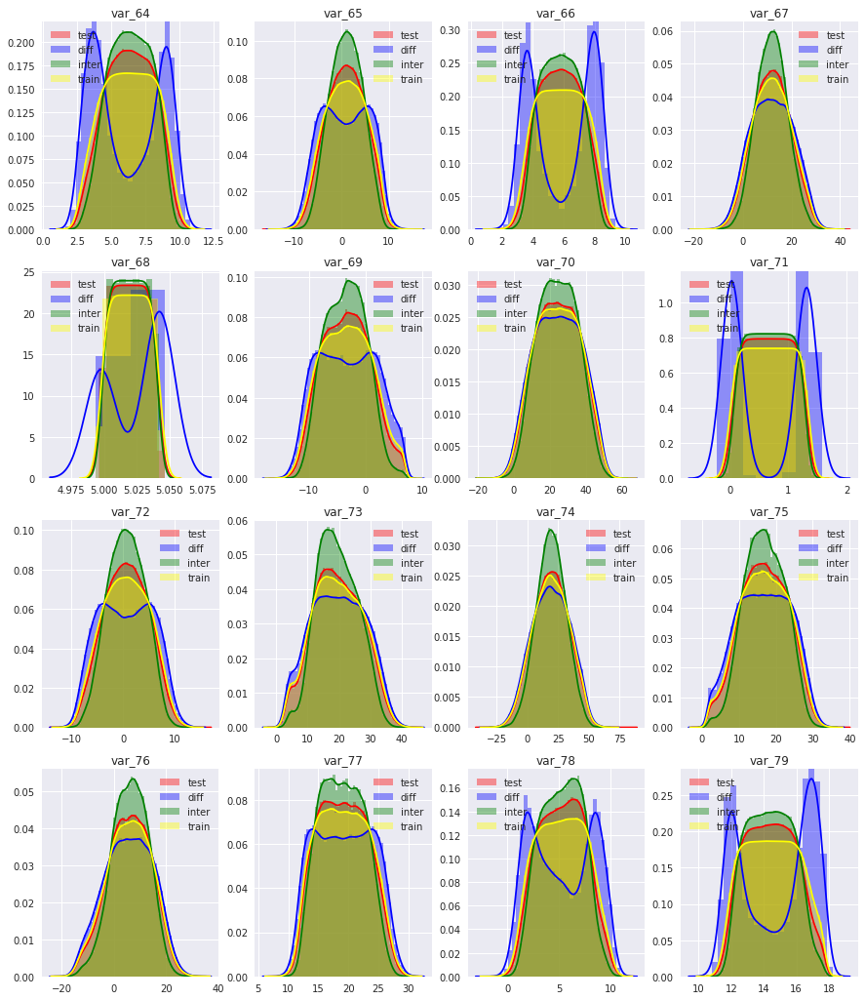

...

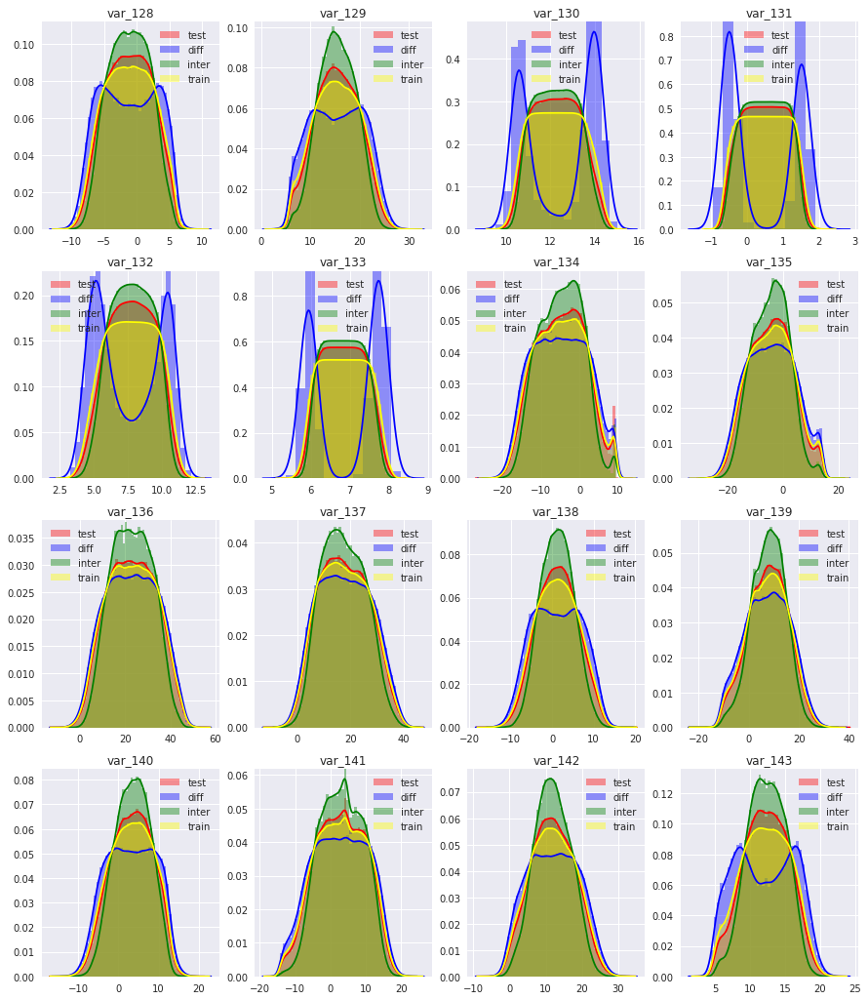

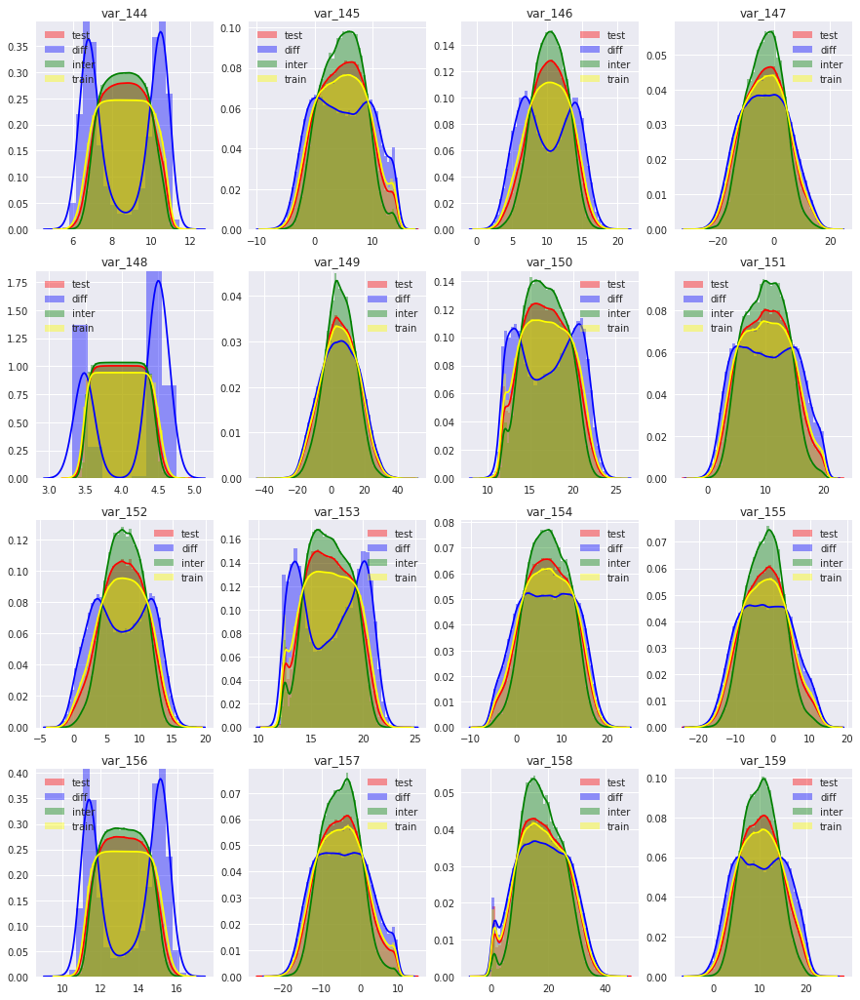

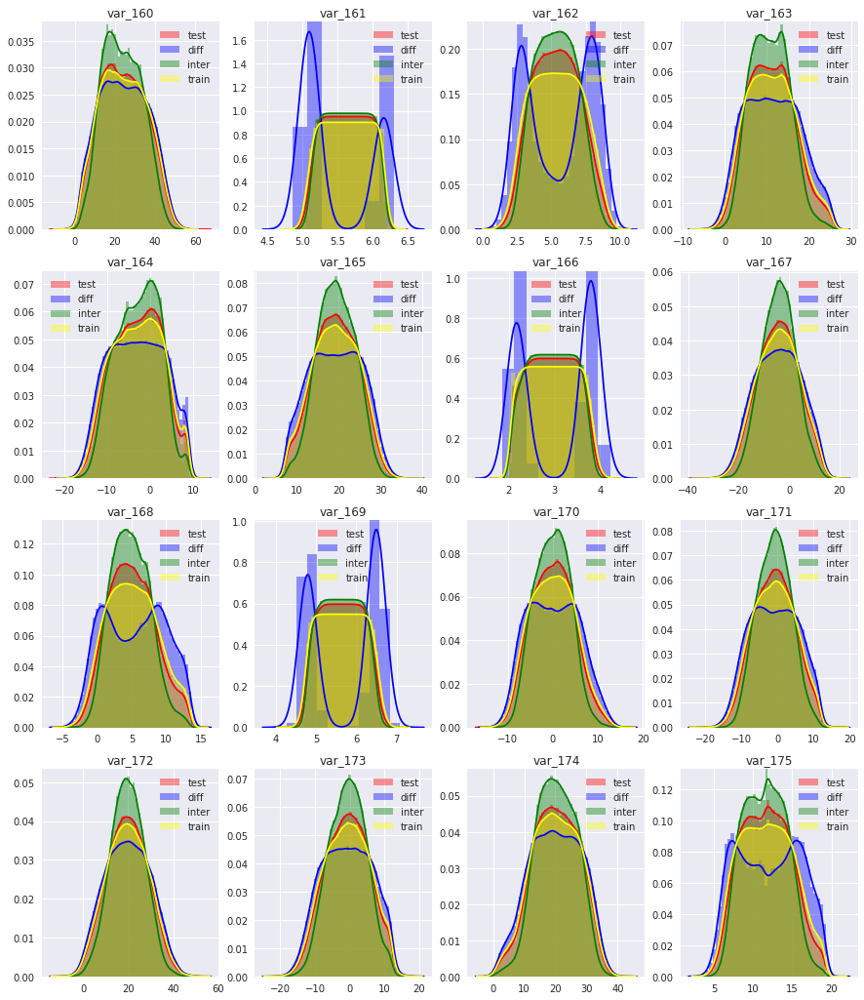

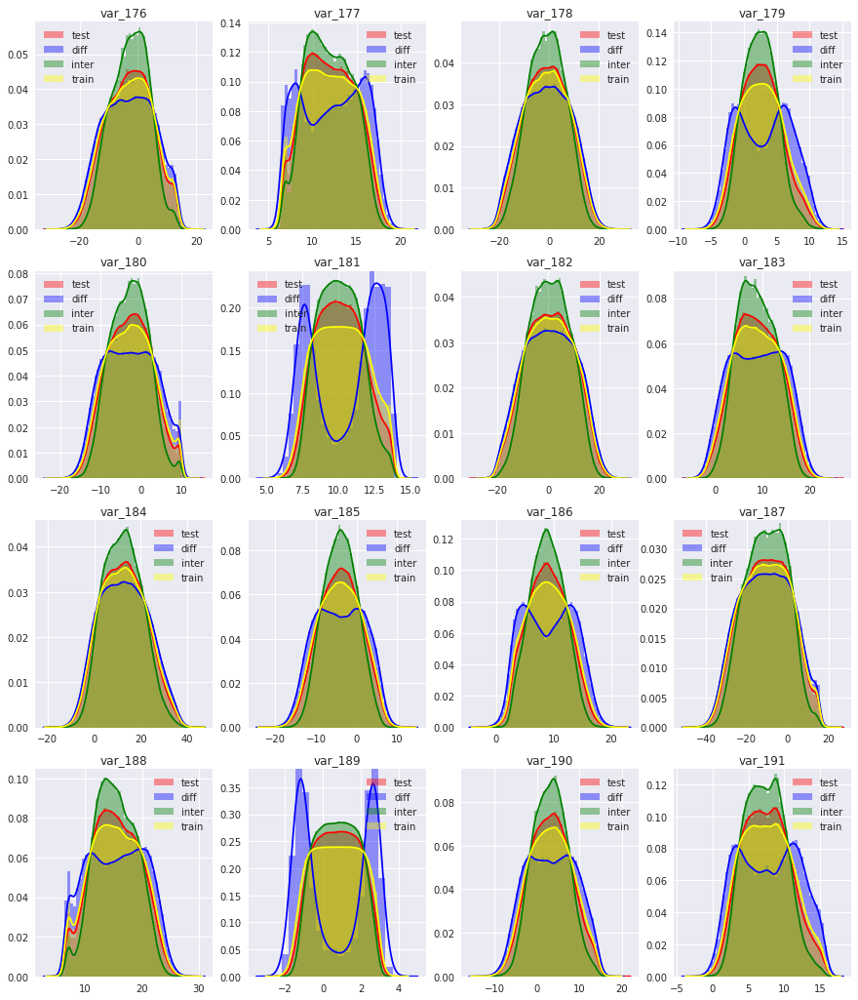

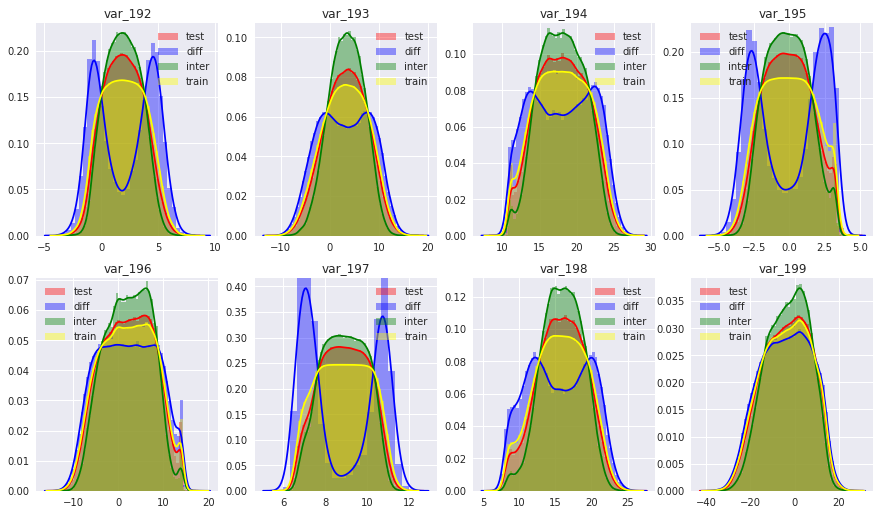

In [35]:
#Plot the distribution of different groups of data, test_data are only real data

true_len = []
fake_len = []
test_real = test_X.iloc[real_idx,:]
for j in range(13):
    plt.figure(figsize=(15,18))
    for i in range(16):
        if i+j*16>199: continue
        plt.subplot(4, 4, i+1)
        train_0 = list(set(train_X['var_'+str(i+j*16)]))
        test_0 = list(set(test_real['var_'+str(i+j*16)]))
        var_0_diff = list(set(train_X['var_'+str(i+j*16)])-set(test_real['var_'+str(i+j*16)]))
        var_0_inter = list(set(train_X['var_'+str(i+j*16)]).intersection(set(test_real['var_'+str(i+j*16)])))
        true_len.append(len(var_0_inter))
        fake_len.append(len(var_0_diff))
        sns.distplot(test_0, label = 'test', color='red')
        sns.distplot(var_0_diff, label = 'diff', color='blue')
        sns.distplot(var_0_inter, label = 'inter', color='green')
        sns.distplot(train_0, label = 'train', color='yellow')
        plt.legend()
        plt.title('var_'+str(i+j*16))
        plt.xlabel('')
    plt.show()

From those pictures, it can be easily got that for training data that variable values do not appear in test data, the distribution seems more disperse. And for the training data that variable values appear in test data, the distribution tend to be centered. Which strongly support the assumption that noises are added in the training data.

In [15]:
var_0_diff_1 = list(set(train_X_1['var_3'])-set(test_X['var_3']))
var_0_diff_0 = list(set(train_X_0['var_3'])-set(test_X['var_3']))

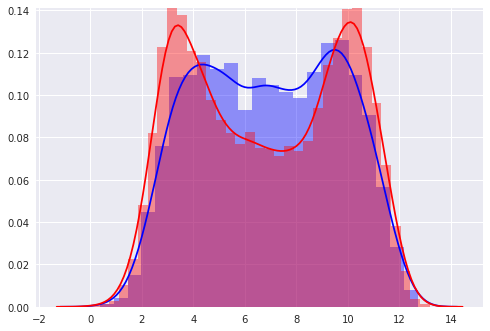

In [19]:
sns.distplot(var_0_diff_1, label = 'diff', color='blue')
sns.distplot(var_0_diff_0, label = 'test', color='red')

So the diffe

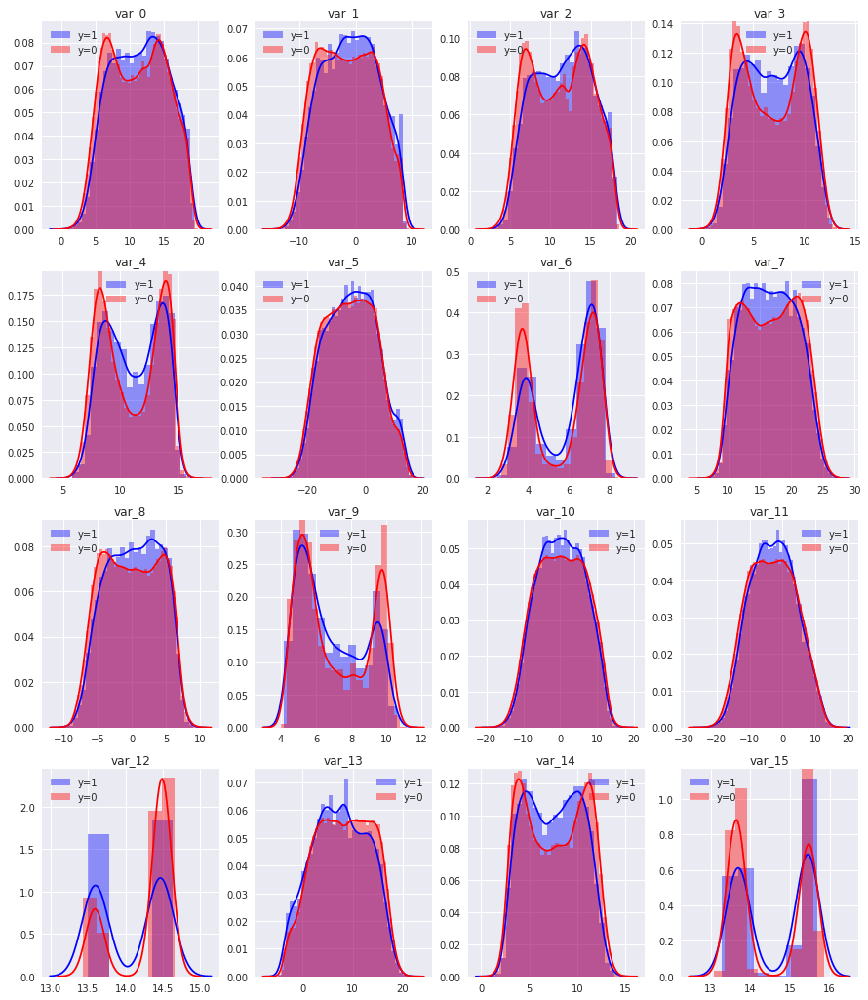

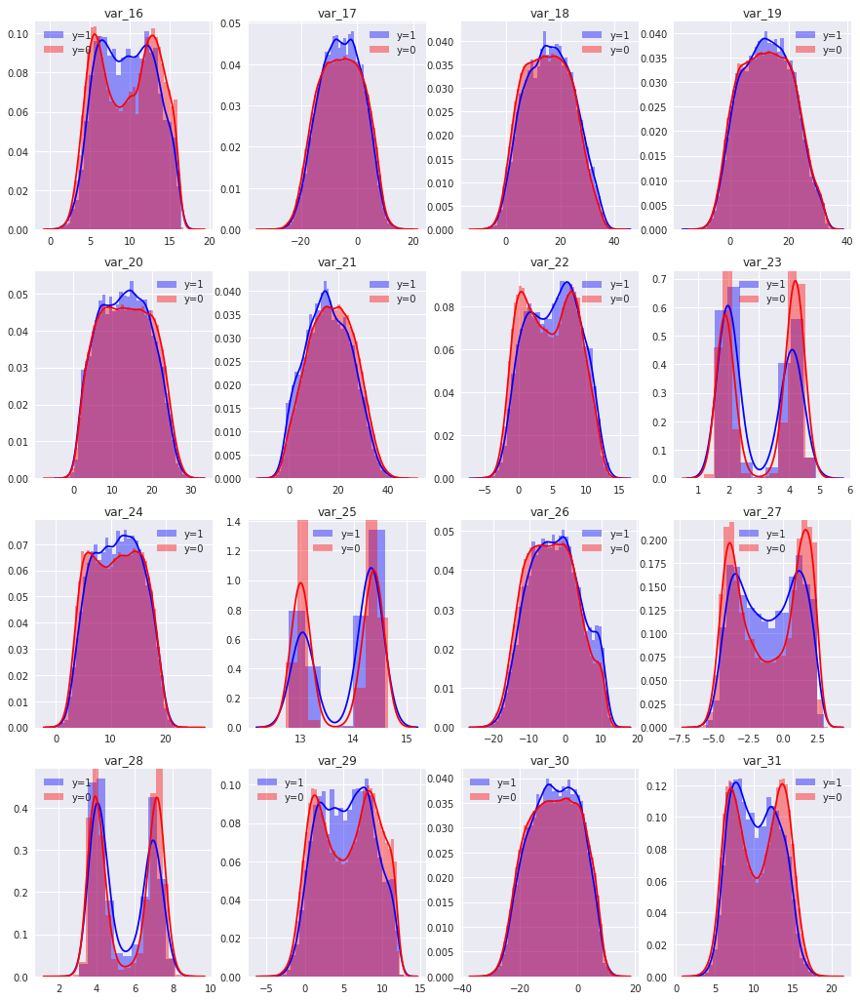

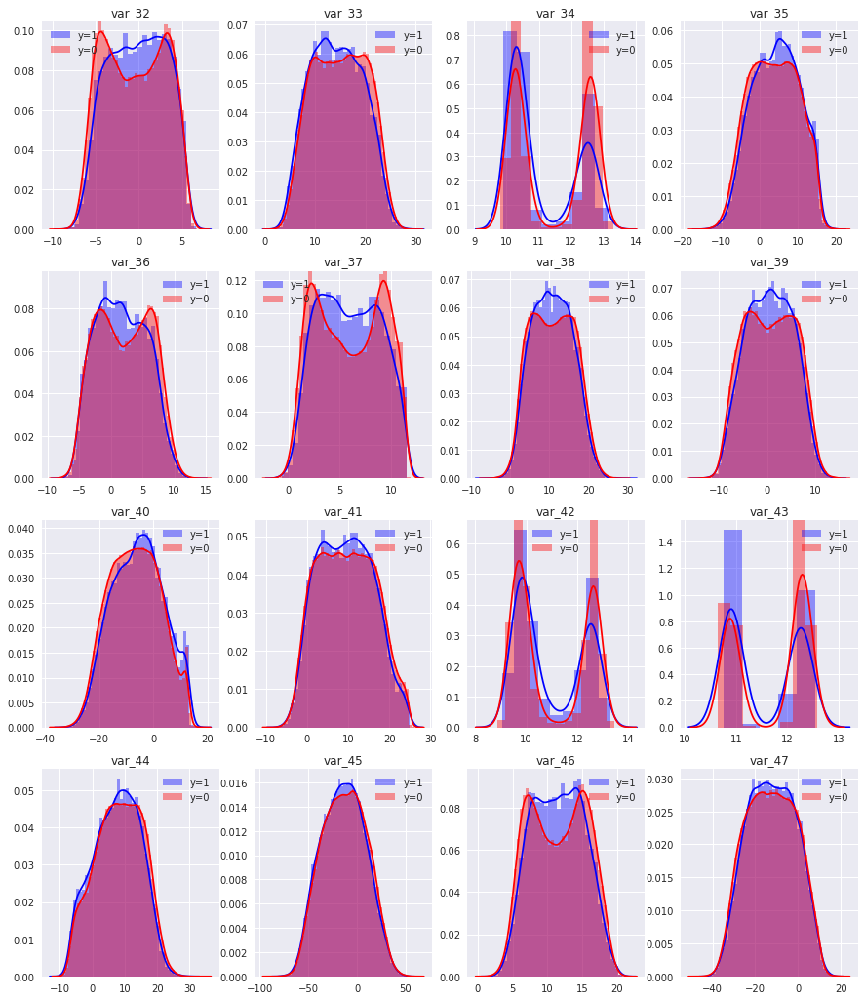

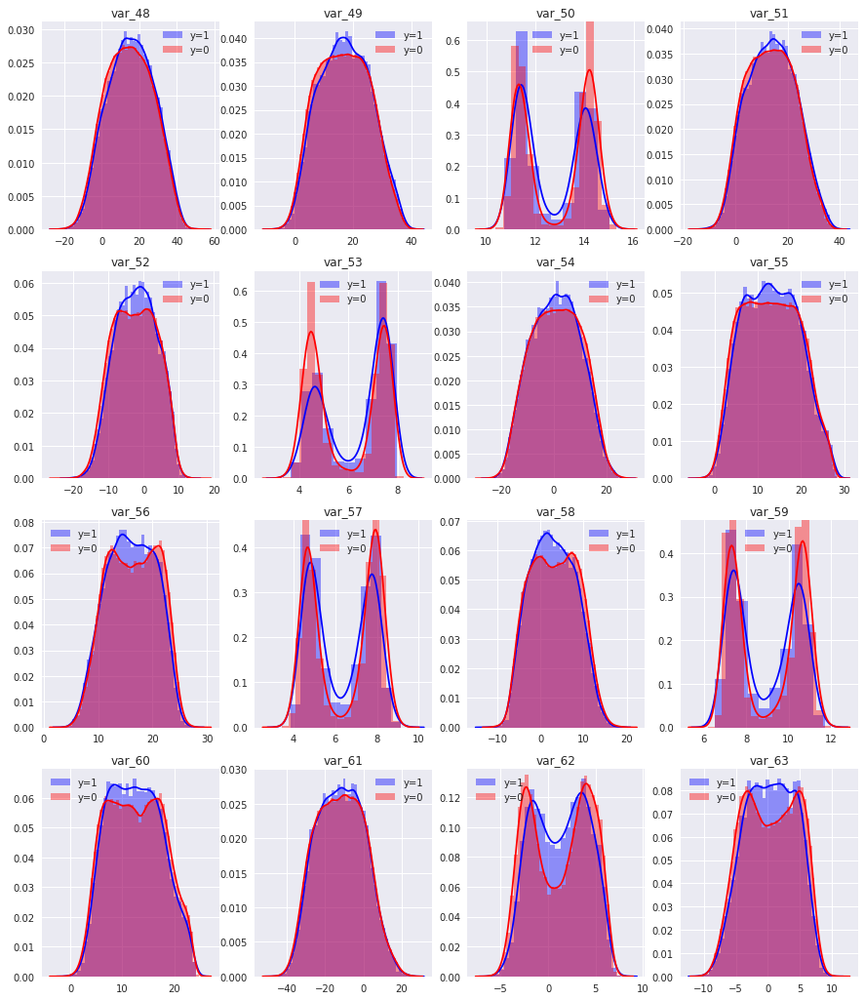

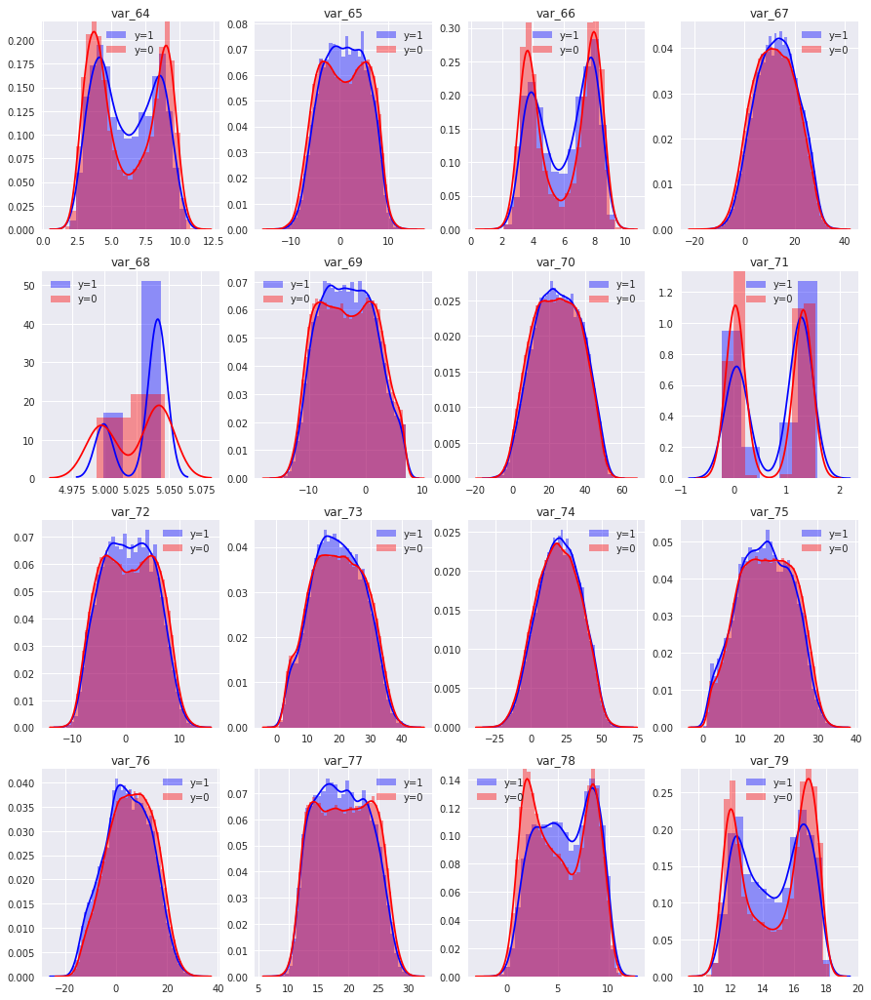

...

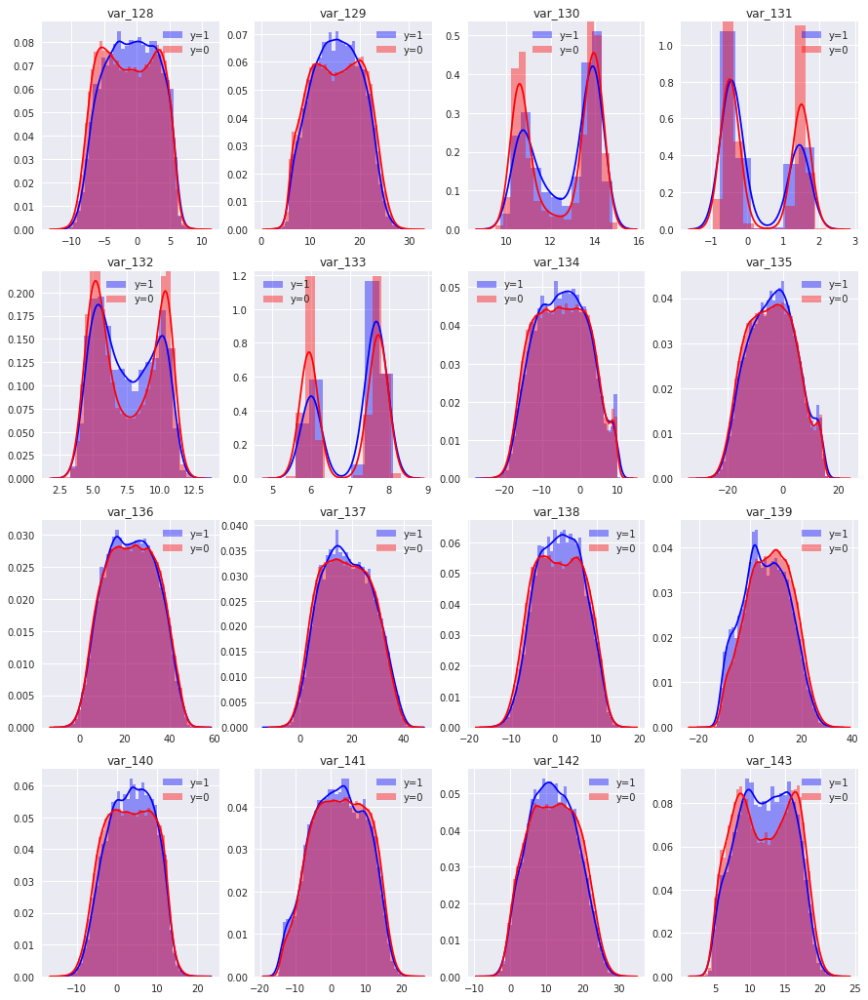

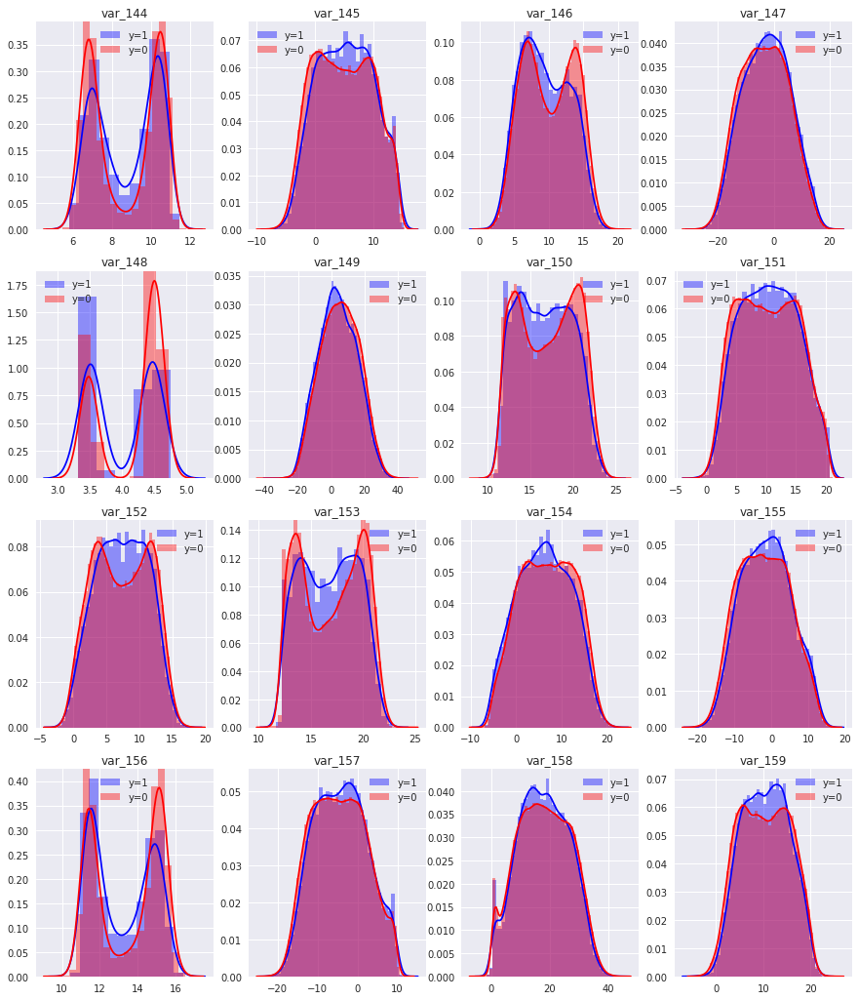

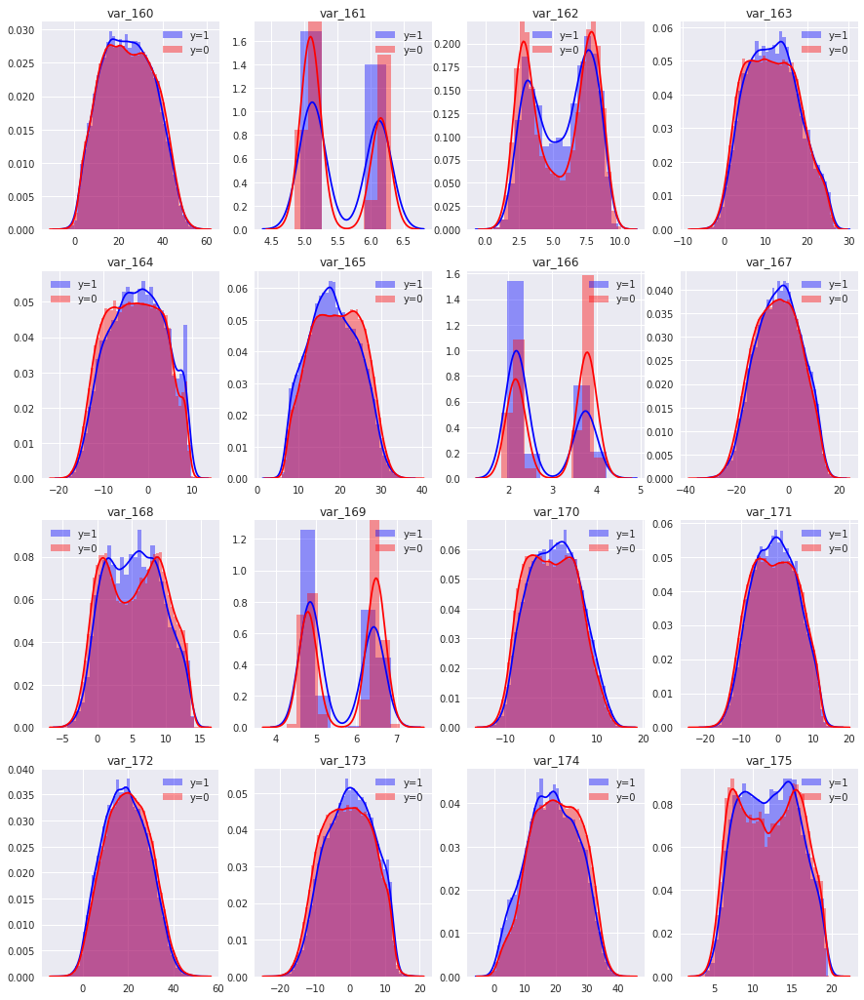

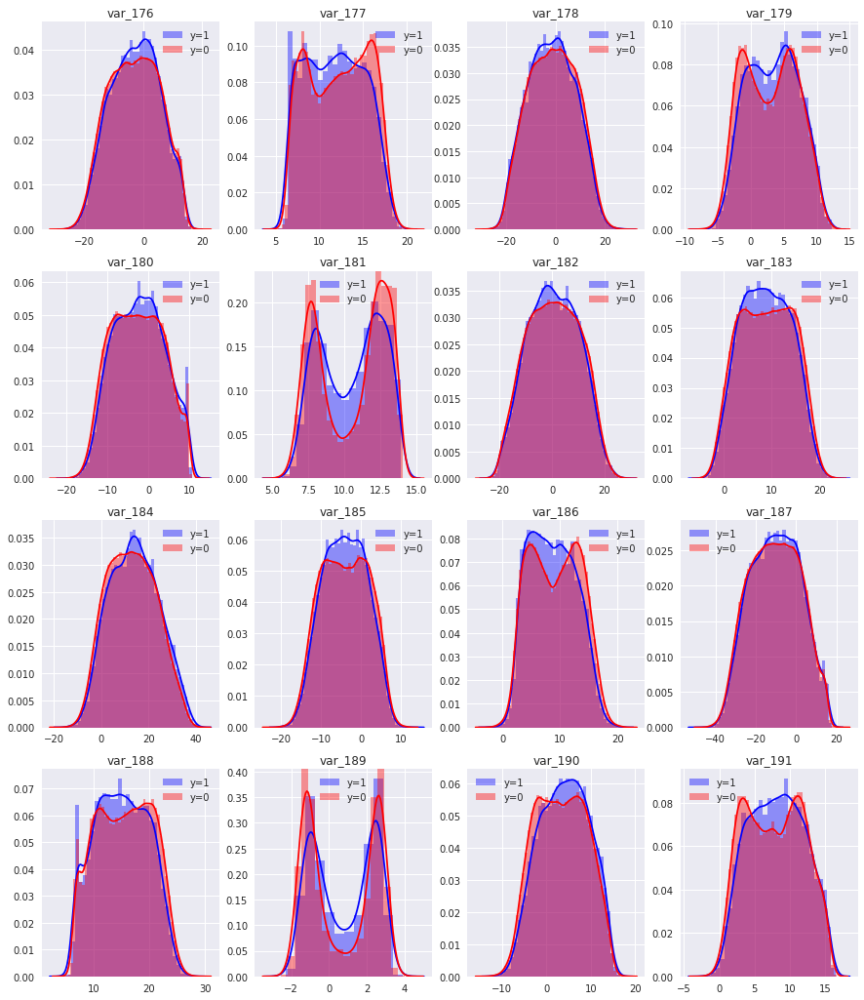

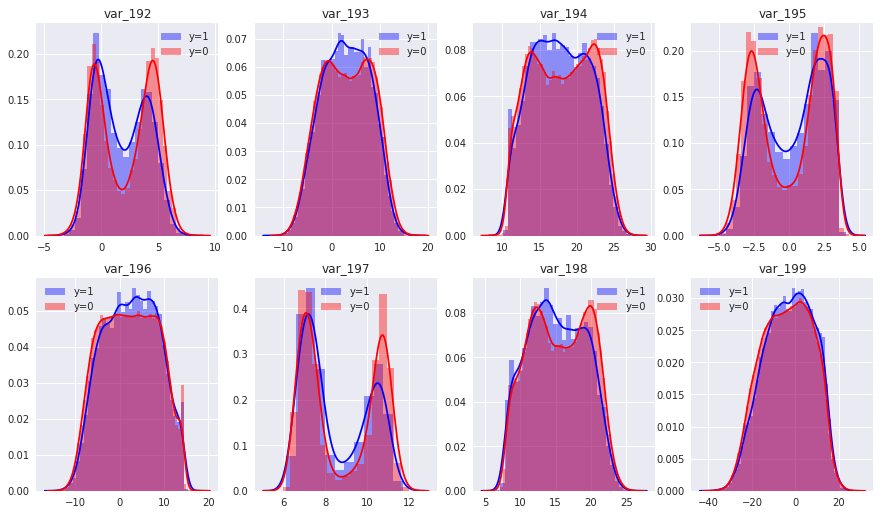

In [32]:
for j in range(13):
    plt.figure(figsize=(15,18))
    for i in range(16):
        if i+j*16>199: continue
        plt.subplot(4, 4, i+1)
        var_diff_1 = list(set(train_X_1['var_'+str(i+j*16)])-set(test_X['var_'+str(i+j*16)]))
        var_diff_0 = list(set(train_X_0['var_'+str(i+j*16)])-set(test_X['var_'+str(i+j*16)]))
        sns.distplot(var_diff_1, label = 'y=1', color='blue')
        sns.distplot(var_diff_0, label = 'y=0', color='red')
        plt.legend()
        plt.title('var_'+str(i+j*16))
        plt.xlabel('')
    plt.show()

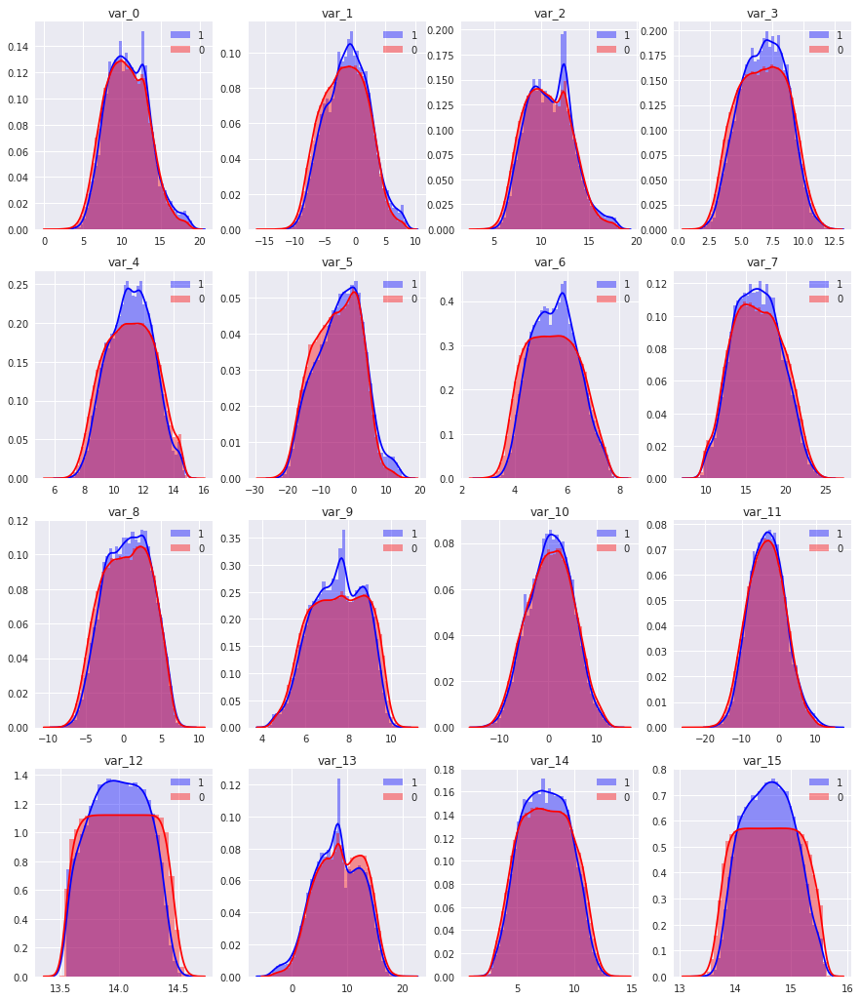

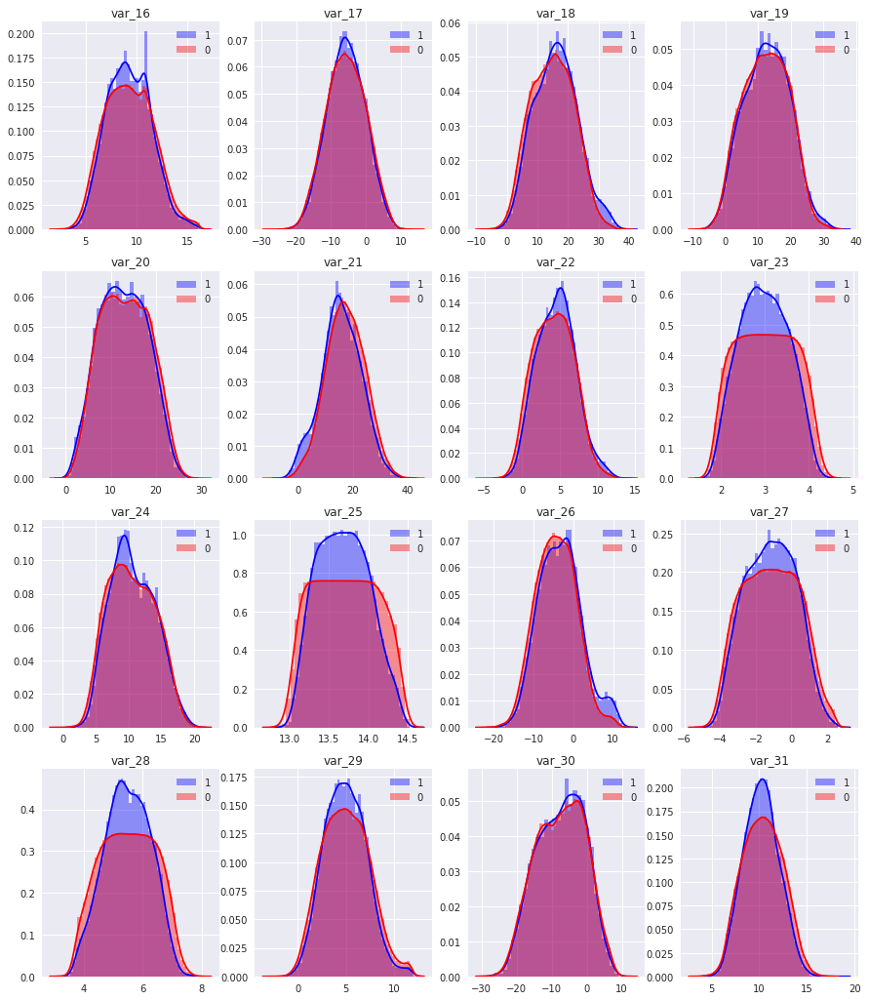

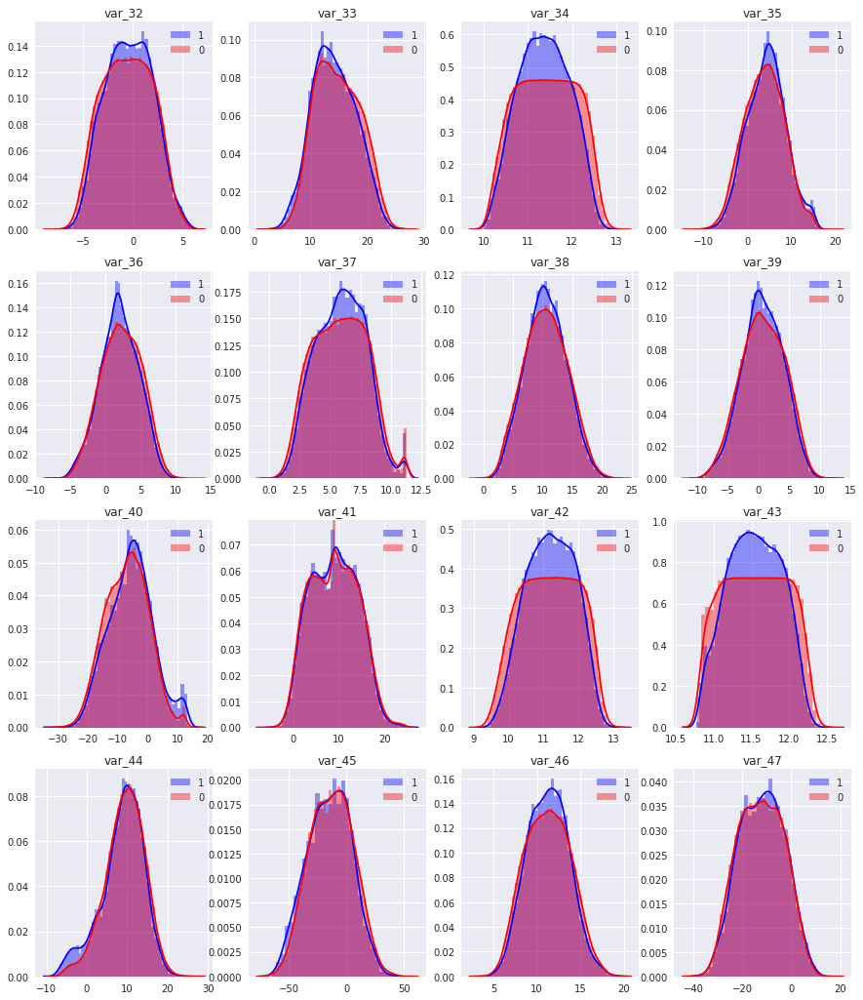

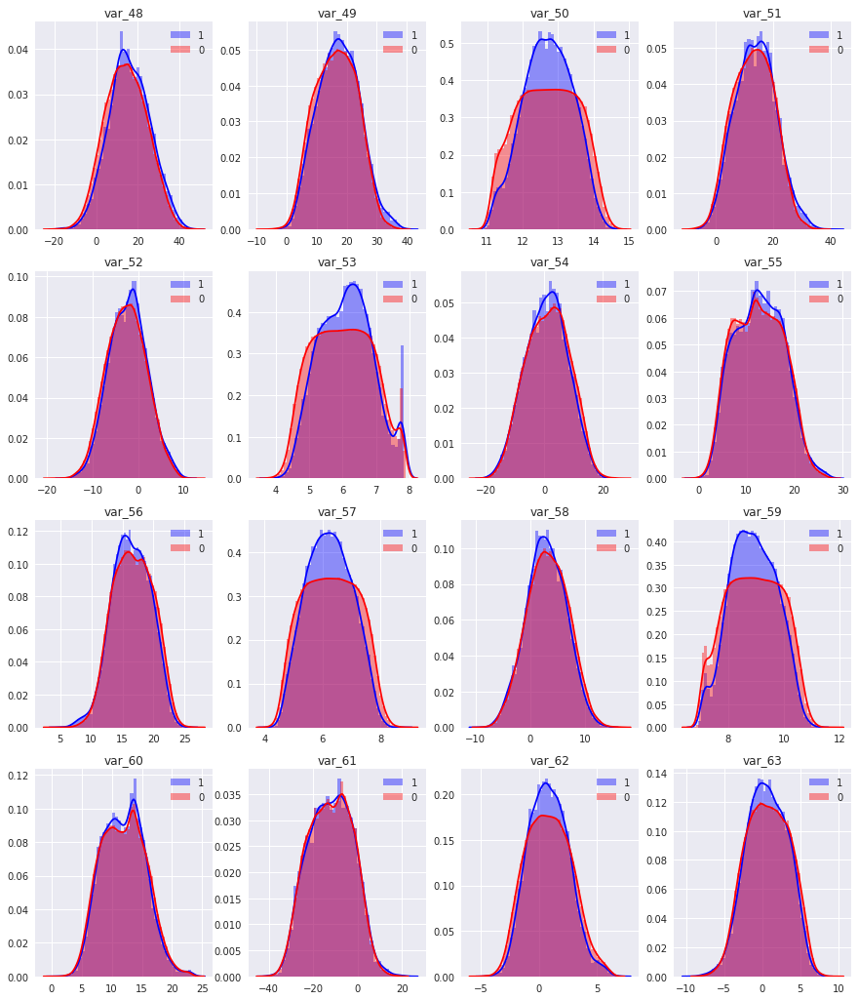

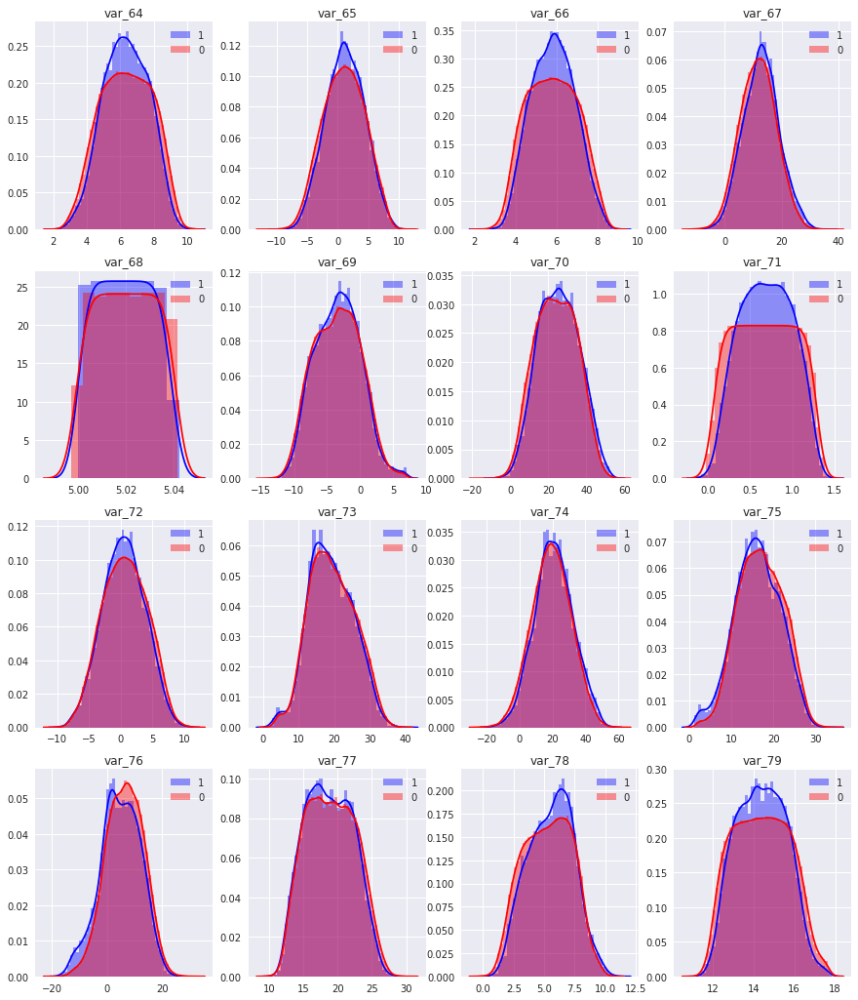

...

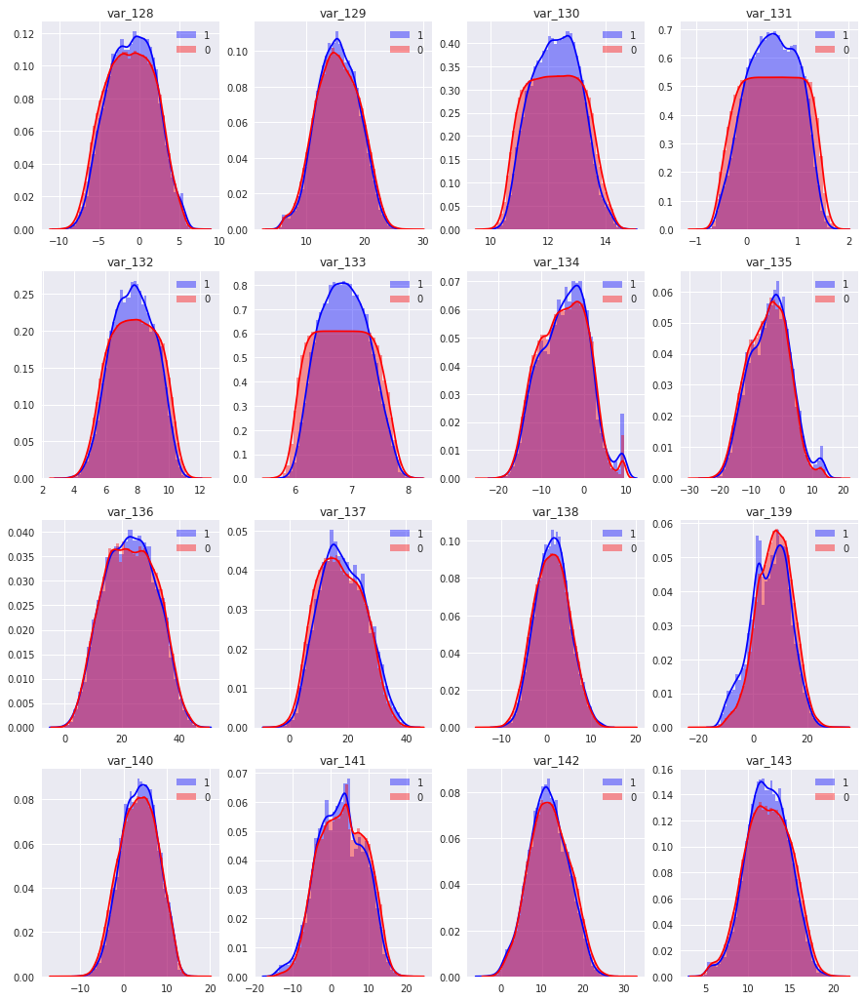

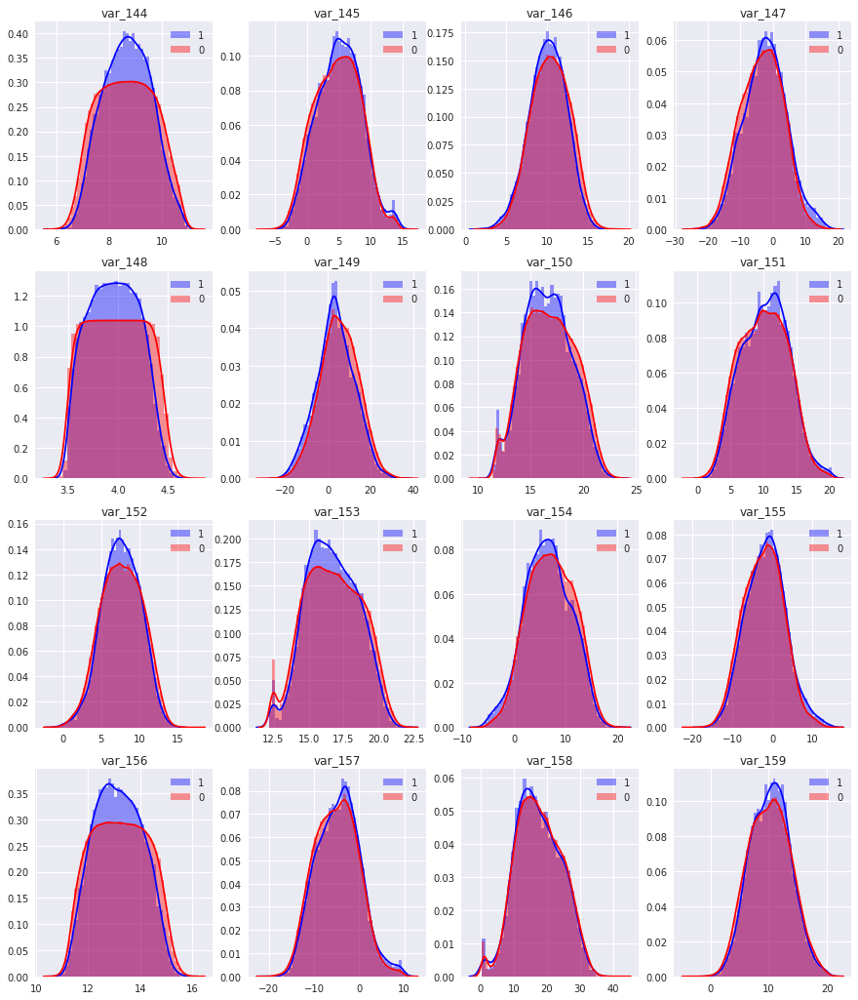

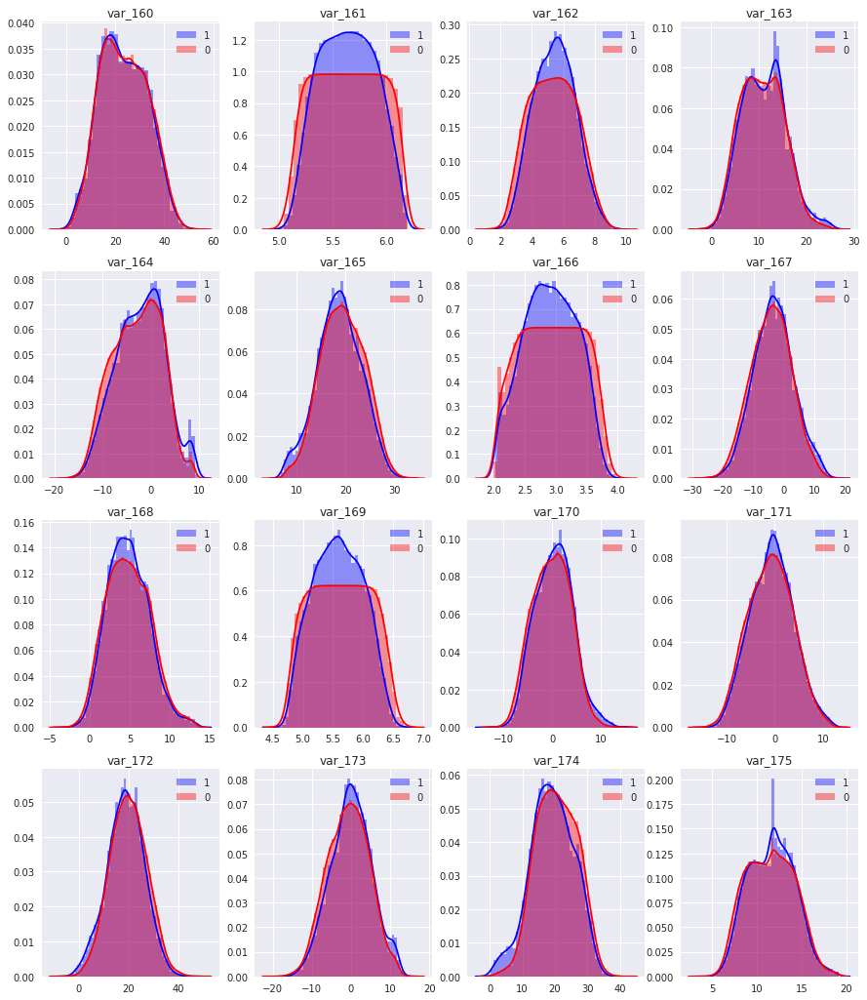

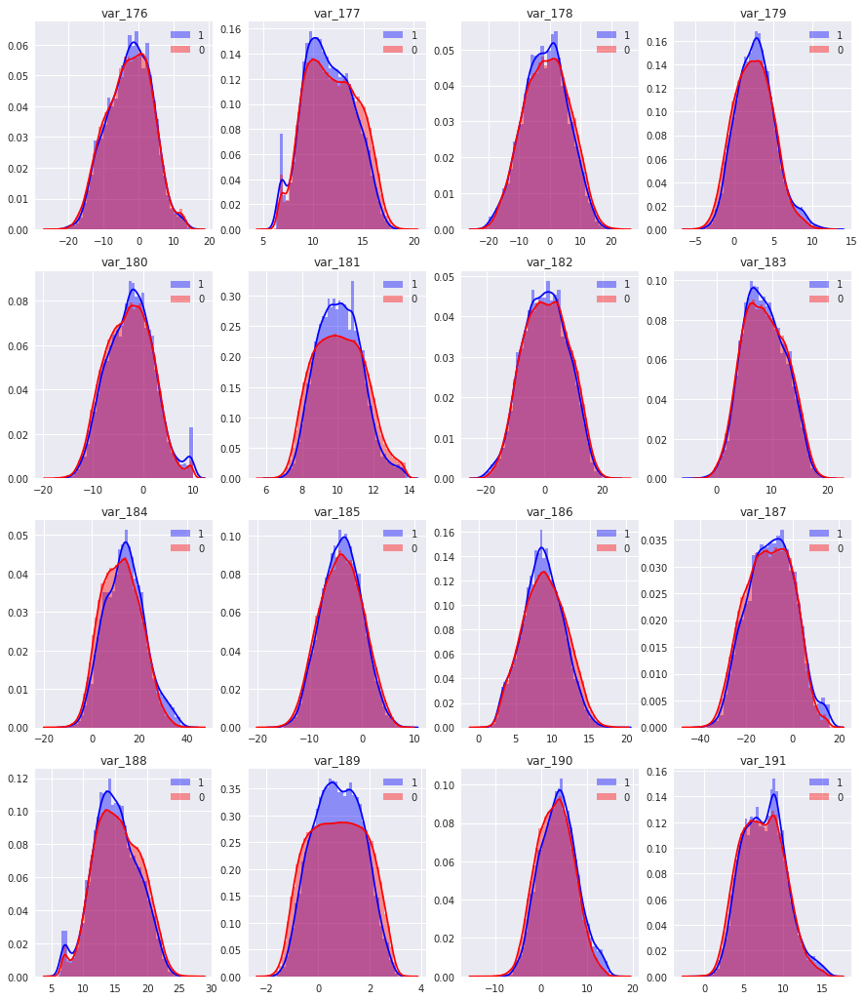

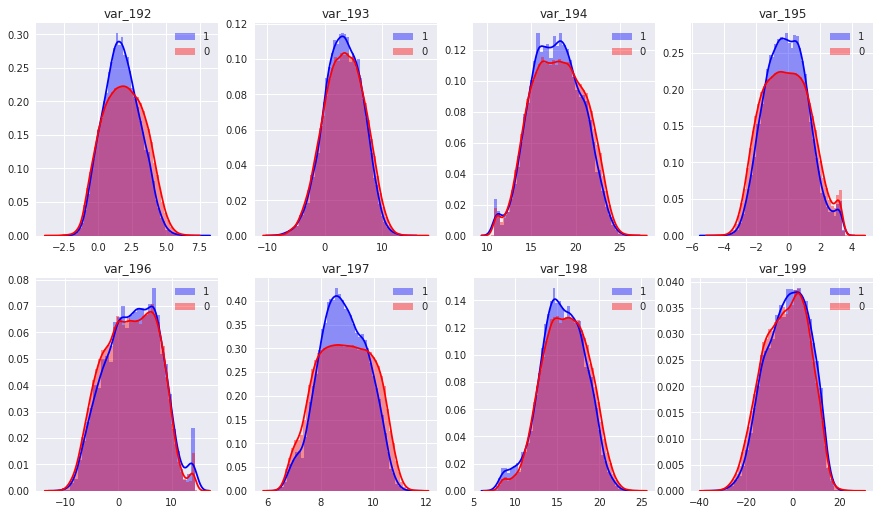

In [16]:
for j in range(13):
    plt.figure(figsize=(15,18))
    for i in range(16):
        if i+j*16>199: continue
        plt.subplot(4, 4, i+1)
        var_inter_0 = list(set(train_X_0['var_'+str(i+j*16)]).intersection(set(test_X['var_'+str(i+j*16)])))
        var_inter_1 = list(set(train_X_1['var_'+str(i+j*16)]).intersection(set(test_X['var_'+str(i+j*16)])))
#         plt.figure(figsize=(5,6))
        sns.distplot(var_inter_1, label = '1', color='blue')
        sns.distplot(var_inter_0, label = '0', color='red')
        plt.legend()
#         plt.title('var_0')
#         plt.xlabel('')
#         plt.show()
#         sns.distplot(df_train0['var_'+str(i+j*16)], label = '0', color='red')
#         sns.distplot(df_train1['var_'+str(i+j*16)], label = '1', color='blue')
        plt.title('var_'+str(i+j*16))
        plt.xlabel('')
    plt.show()

In [ ]:
test_0 = list(set(test_real['var_'+str(i+j*16)]))

In [36]:
import seaborn as sns, matplotlib.pyplot as plt
# df_train0 = df_train[ df_train['target']==0 ]
# df_train1 = df_train[ df_train['target']==1 ]
true_len = []
fake_len = []
test_real = test_X.iloc[real_samples_indexes,:]
for j in range(13):
    plt.figure(figsize=(15,18))
    for i in range(16):
        if i+j*16>199: continue
        plt.subplot(4, 4, i+1)
        train_0 = list(set(train_X_0['var_'+str(i+j*16)]))
        test_0 = list(set(test_real['var_'+str(i+j*16)]))
        var_0_diff = list(set(train_X_0['var_'+str(i+j*16)])-set(test_real['var_'+str(i+j*16)]))
        var_0_inter = list(set(train_X_0['var_'+str(i+j*16)]).intersection(set(test_real['var_'+str(i+j*16)])))
#         plt.figure(figsize=(5,6))
        true_len.append(len(var_0_inter))
        fake_len.append(len(var_0_diff))
        sns.distplot(test_0, label = 'test', color='red')
        sns.distplot(var_0_diff, label = 'diff', color='blue')
        sns.distplot(var_0_inter, label = 'inter', color='green')
        sns.distplot(train_0, label = 'train', color='yellow')
        plt.legend()
#         plt.title('var_0')
#         plt.xlabel('')
#         plt.show()
#         sns.distplot(df_train0['var_'+str(i+j*16)], label = '0', color='red')
#         sns.distplot(df_train1['var_'+str(i+j*16)], label = '1', color='blue')
        plt.title('var_'+str(i+j*16))
        plt.xlabel('')
    plt.show()

NameError: name 'real_samples_indexes' is not defined

In [ ]:
import seaborn as sns, matplotlib.pyplot as plt
# df_train0 = df_train[ df_train['target']==0 ]
# df_train1 = df_train[ df_train['target']==1 ]
true_len = []
fake_len = []
test_real = test_X.iloc[real_samples_indexes,:]
for j in range(13):
    plt.figure(figsize=(15,18))
    for i in range(16):
        if i+j*16>199: continue
        plt.subplot(4, 4, i+1)
        train_0 = list(set(train_X_1['var_'+str(i+j*16)]))
        test_0 = list(set(test_real['var_'+str(i+j*16)]))
        var_0_diff = list(set(train_X_1['var_'+str(i+j*16)])-set(test_real['var_'+str(i+j*16)]))
        var_0_inter = list(set(train_X_1['var_'+str(i+j*16)]).intersection(set(test_real['var_'+str(i+j*16)])))
#         plt.figure(figsize=(5,6))
        true_len.append(len(var_0_inter))
        fake_len.append(len(var_0_diff))
        sns.distplot(test_0, label = 'test', color='red')
        sns.distplot(var_0_diff, label = 'diff', color='blue')
        sns.distplot(var_0_inter, label = 'inter', color='green')
        sns.distplot(train_0, label = 'train', color='yellow')
        plt.legend()
#         plt.title('var_0')
#         plt.xlabel('')
#         plt.show()
#         sns.distplot(df_train0['var_'+str(i+j*16)], label = '0', color='red')
#         sns.distplot(df_train1['var_'+str(i+j*16)], label = '1', color='blue')
        plt.title('var_'+str(i+j*16))
        plt.xlabel('')
    plt.show()

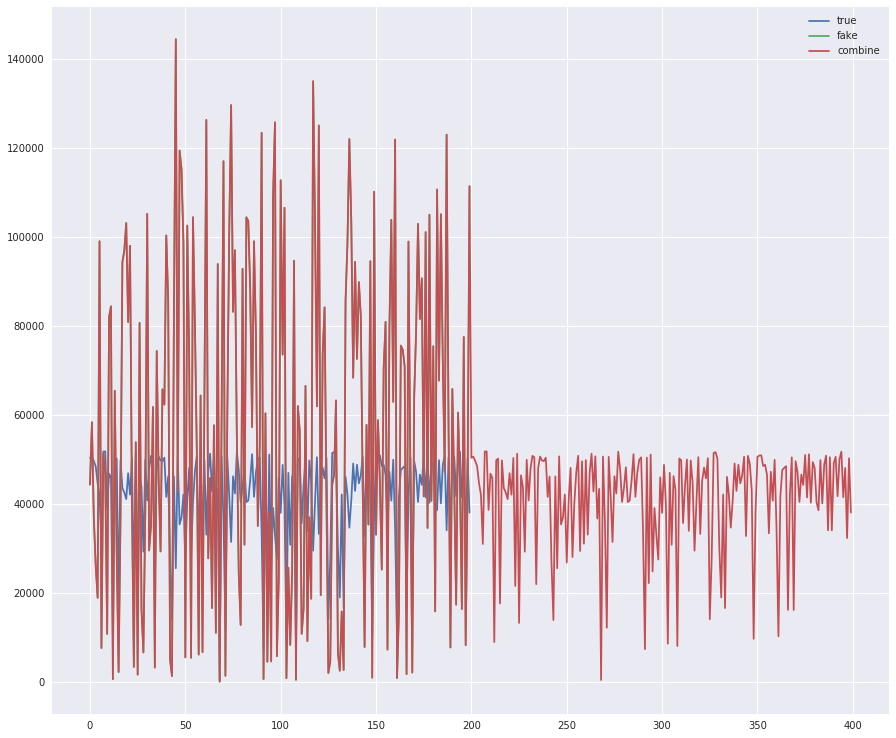

In [78]:
plt.figure(figsize=(15,13))

plt.plot(true_len, label = 'true')
plt.plot(fake_len, label = 'fake')
plt.plot(fake_len+true_len, label = 'combine')

plt.legend()

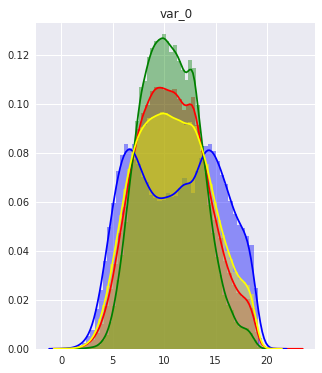

In [45]:
train_0 = list(set(train_X.var_0))
test_0 = list(set(test_X.var_0))
var_0_diff = list(set(train_X.var_0)-set(test_X.var_0))
var_0_inter = list(set(train_X.var_0).intersection(set(test_X.var_0)))
plt.figure(figsize=(5,6))
sns.distplot(test_0, label = '0', color='red')
sns.distplot(var_0_diff, label = '1', color='blue')
sns.distplot(var_0_inter, label = '1', color='green')
sns.distplot(train_0, label = '1', color='yellow')
plt.title('var_0')
plt.xlabel('')
plt.show()

In [14]:
_, index_, count_ = np.unique(test_X.iloc[:, 1], return_counts=True, return_index=True)

Check for each observations, how many variables are in test data.

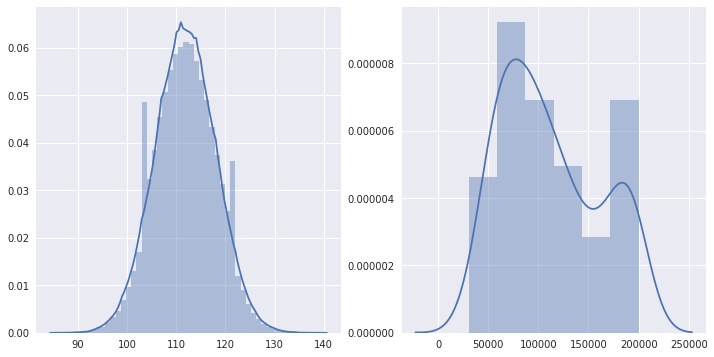

In [53]:
# unique_samples = []
train_in_test = np.zeros_like(train_X)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test[:,feature] = train_X.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
sns.distplot(train_in_test.sum(axis=1))
plt.subplot(1, 2, 2)
sns.distplot(train_in_test.sum(axis=0))

So for most variables, there are half of the data are real and half are sythetic, but still some are like **all real**

In [ ]:
sns.

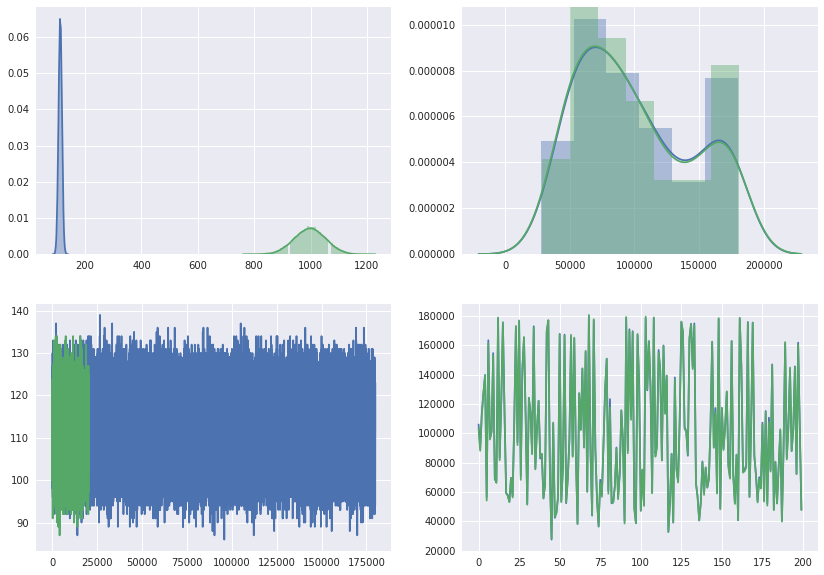

In [10]:
# unique_samples = []
train_in_test_0 = np.zeros_like(train_X_0)
train_in_test_1 = np.zeros_like(train_X_1)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test_0[:,feature] = train_X_0.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))
# unique_samples = []
train_in_test_1 = np.zeros_like(train_X_1)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test_1[:,feature] = train_X_1.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))
    

plt.figure(figsize=(14,10))
plt.subplot(2, 2, 1)
sns.distplot(train_in_test_0.sum(axis=1))
sns.distplot(train_in_test_1.sum(axis=1))
plt.subplot(2, 2, 2)
sns.distplot(train_in_test_0.sum(axis=0))
sns.distplot(train_in_test_1.sum(axis=0)*9)
plt.subplot(2, 2, 3)
plt.plot(train_in_test_0.sum(axis=1))
plt.plot(train_in_test_1.sum(axis=1))
plt.subplot(2, 2, 4)
plt.plot(train_in_test_0.sum(axis=0))
plt.plot(train_in_test_1.sum(axis=0)*9)

In [ ]:
train_1

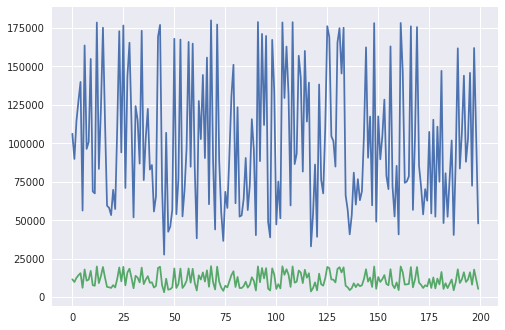

In [76]:
# unique_samples = []
train_in_test_0 = np.zeros_like(train_0)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test_0[:,feature] = train_0.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))

train_in_test_1 = np.zeros_like(train_1)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test_1[:,feature] = train_1.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))

plt.plot(train_in_test_0.sum(axis=0))    
plt.plot(train_in_test_1.sum(axis=0))    

In [77]:
train_in_test_0.sum(axis=0).shape

(200,)

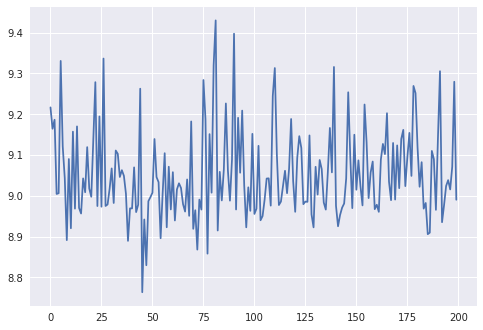

In [81]:
plt.plot(np.divide(train_in_test_0.sum(axis=0),train_in_test_1.sum(axis=0)))  

In [33]:
# unique_samples = []
train_in_test = np.zeros_like(train_1)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test[:,feature] = train_1.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
sns.distplot(train_in_test.sum(axis=1))
plt.subplot(1, 2, 2)
sns.distplot(train_in_test.sum(axis=0))

NameError: name 'train_1' is not defined

In [62]:
np.save('train_in_test',train_in_test)

In [59]:
train_in_test

(200000, 200)

In [56]:
sum(train_in_test.sum(axis=0)>170000)

39

In [58]:
np.where(train_in_test.sum(axis=0)>160000)

(array([  6,   9,  12,  15,  23,  25,  28,  34,  42,  43,  50,  53,  57,
         59,  64,  66,  68,  71,  79,  91,  93,  95,  98, 103, 105, 108,
        111, 114, 125, 126, 130, 131, 132, 133, 144, 148, 156, 161, 162,
        166, 169, 181, 189, 192, 195, 197]),)

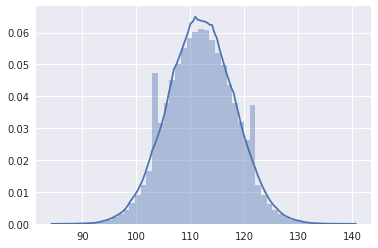

In [19]:
# unique_samples = []
train_in_test_0 = np.zeros_like(train_X_0)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test_0[:,feature] = train_X_0.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))
    
sns.distplot(train_in_test_0.sum(axis=1))

In [22]:
cnt_0 = pd.DataFrame({'cnt_0': train_in_test_0.sum(axis=1)})
cnt_1 = pd.DataFrame({'cnt_1': train_in_test_1.sum(axis=1)})

In [29]:
dict(cnt_0.cnt_0.value_counts())[112.0]

11661

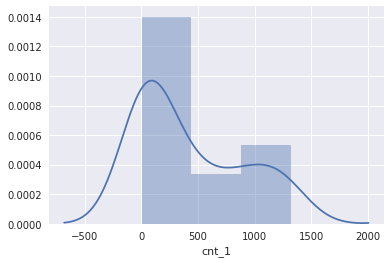

In [39]:
sns.distplot(cnt_1.cnt_1.value_counts())

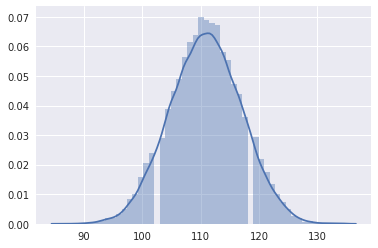

In [20]:
# unique_samples = []
train_in_test_1 = np.zeros_like(train_X_1)
for feature in tqdm_notebook(range(test_X.shape[1])):
    train_in_test_1[:,feature] = train_X_1.iloc[:, feature].isin(np.unique(test_X.iloc[:, feature]))
    
sns.distplot(train_in_test_1.sum(axis=1))

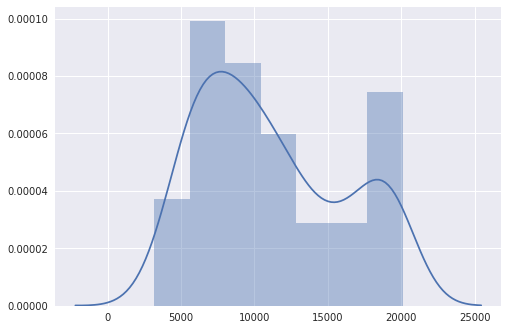

In [45]:
sns.distplot(train_in_test.sum(axis=0))

## Get synthetic and real data index in test data.

In [24]:
unique_samples = []
unique_count = np.zeros_like(df_test)
for feature in tqdm_notebook(range(test_X.shape[1])):
    _, index_, count_ = np.unique(test_X.iloc[:, feature], return_counts=True, return_index=True)
    
    unique_count[index_[count_ == 1], feature] += 1

# Samples which have unique values are real the others are fake
real_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) > 0)[:, 0]
synthetic_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) == 0)[:, 0]

print(len(real_samples_indexes))
print(len(synthetic_samples_indexes))


100000
100000


In [70]:
df_test_real = test_X.values[real_samples_indexes,:].copy()

generator_for_each_synthetic_sample = []
# Using 20,000 samples should be enough. 
# You can use all of the 100,000 and get the same results (but 5 times slower)
for cur_sample_index in tqdm_notebook(synthetic_samples_indexes[:20000]):
    cur_synthetic_sample = test_X.values[cur_sample_index]
    potential_generators = df_test_real == cur_synthetic_sample

    # A verified generator for a synthetic sample is achieved
    # only if the value of a feature appears only once in the
    # entire real samples set
    features_mask = np.sum(potential_generators, axis=0) == 1
    verified_generators_mask = np.any(potential_generators[:, features_mask], axis=1)
    verified_generators_for_sample = real_samples_indexes[np.argwhere(verified_generators_mask)[:, 0]]
    generator_for_each_synthetic_sample.append(set(verified_generators_for_sample))

In [72]:
public_LB = generator_for_each_synthetic_sample[0]
for x in tqdm_notebook(generator_for_each_synthetic_sample):
    if public_LB.intersection(x):
        public_LB = public_LB.union(x)

private_LB = generator_for_each_synthetic_sample[1]
for x in tqdm_notebook(generator_for_each_synthetic_sample):
    if private_LB.intersection(x):
        private_LB = private_LB.union(x)
        
print(len(public_LB))
print(len(private_LB))


50000
50000


In [73]:
np.save('public_LB', list(public_LB))
np.save('private_LB', list(private_LB))
np.save('synthetic_samples_indexes', list(synthetic_samples_indexes))

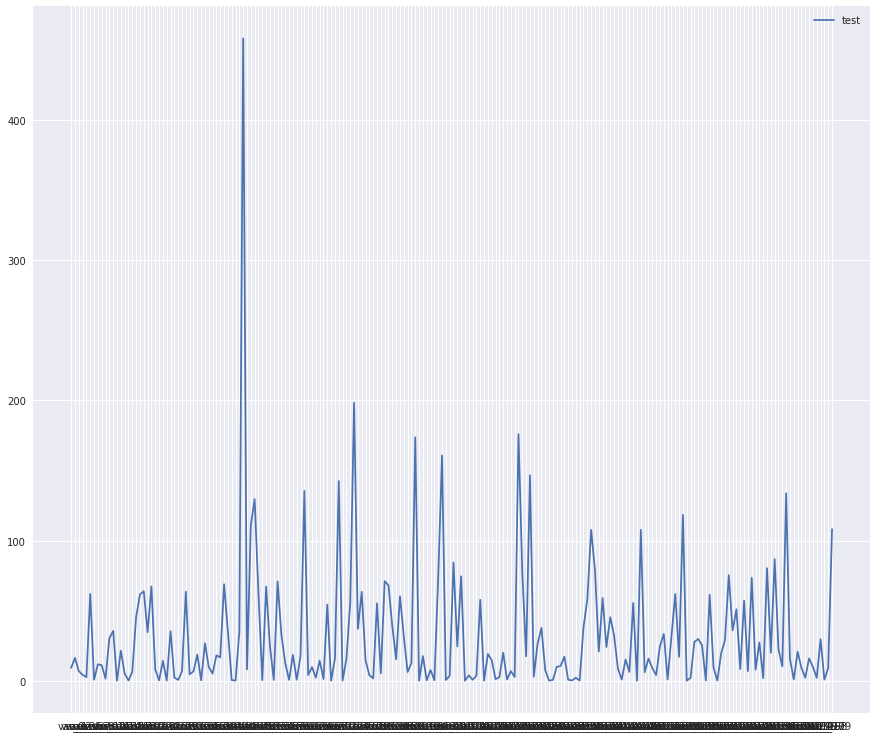

In [19]:
plt.figure(figsize=(15,13))

# plt.plot(train_var, label = 'train')
plt.plot(test_var, label = 'test')
# plt.plot(train_var-test_var, label = 'difference')

plt.legend()

Check the correlation for var_1 with other variables

In [32]:
df_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


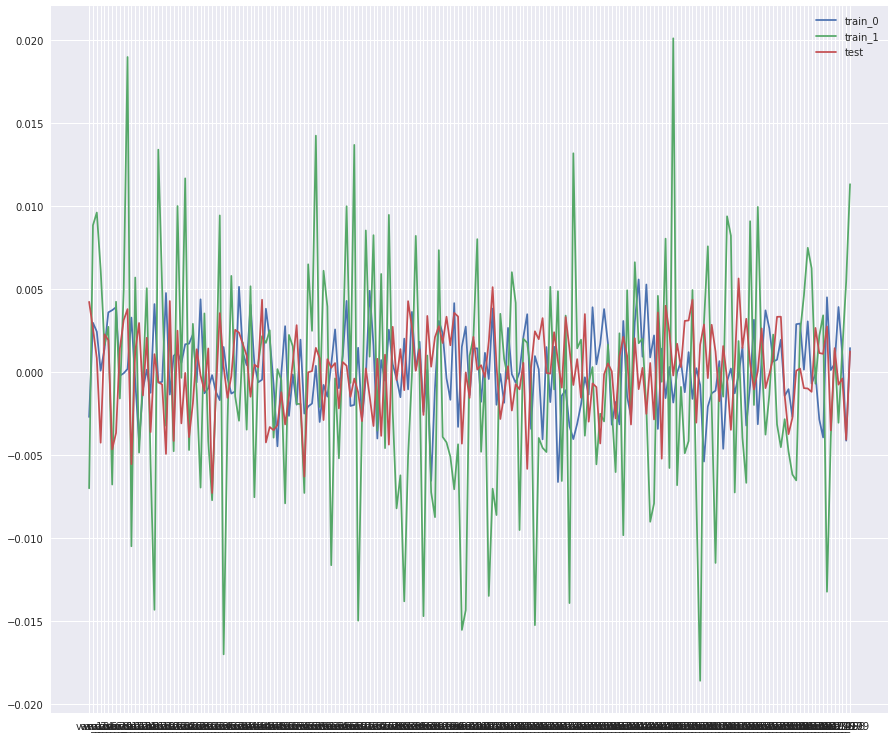

In [31]:
plt.figure(figsize=(15,13))

plt.plot(corr_0.iloc[0,1:], label = 'train_0')
plt.plot(corr_1.iloc[0,1:], label = 'train_1')
plt.plot(corr_test.iloc[0,1:], label = 'test')

plt.legend()

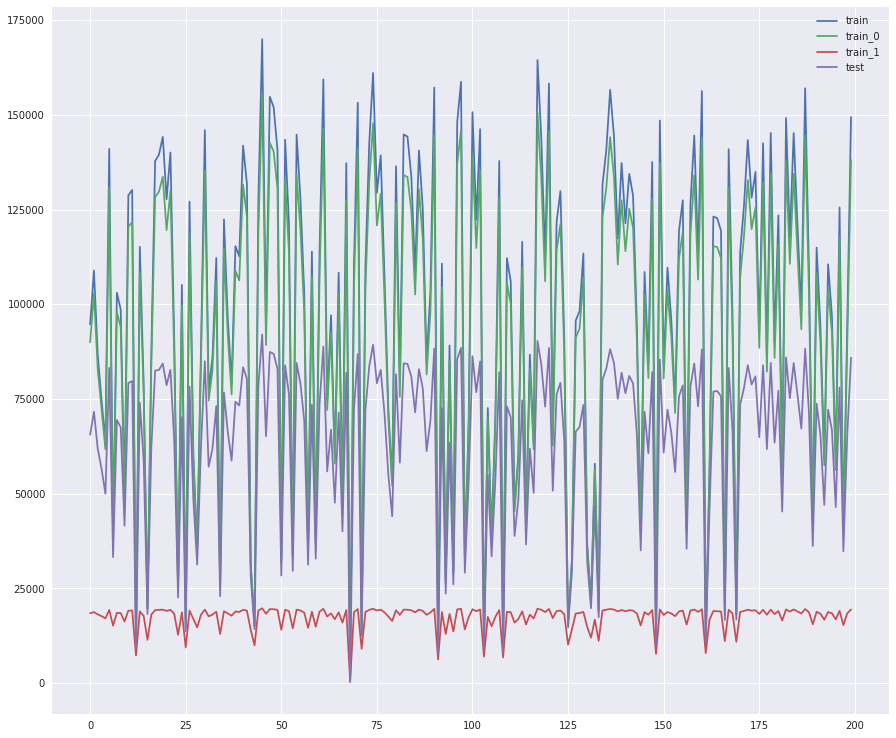

In [75]:
plt.figure(figsize=(15,13))
plt.plot(train_unique.values, label = 'train')
plt.plot(train_unique_0.values, label = 'train_0')
plt.plot(train_unique_1.values, label = 'train_1')
plt.plot(test_unique.values[1:],label = 'test')
plt.legend()

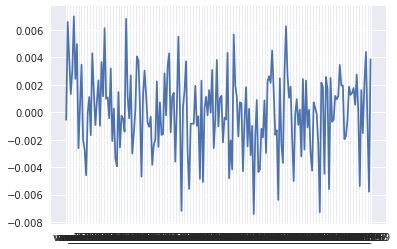

In [18]:
plt.plot(corr_train.iloc[1:,0])

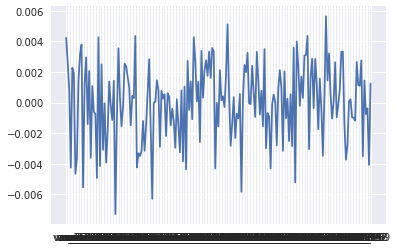

In [19]:
plt.plot(corr.iloc[1:,0])

In [39]:
unique_df = pd.DataFrame({'train': train_unique,
                          'test': test_unique,
                          'train_0': train_unique_0,
                          'train_1': train_unique_1})

In [40]:
unique_df.corr()

,test,train,train_0,train_1
test,1.000000,0.985702,0.989479,0.922223
train,0.985702,1.000000,0.999697,0.856247
train_0,0.989479,0.999697,1.000000,0.866526
train_1,0.922223,0.856247,0.866526,1.000000


In [74]:
train_unique_1.values.shape

(200,)

In [46]:
train_unique_1.values

NameError: name 'train_unique_1' is not defined

In [62]:
df_train[df_train['target']==1].var_1.nunique()

18744

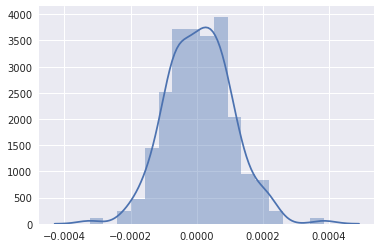

In [51]:
sns.distplot(np.random.normal(0,1e-4,200))

In [42]:
train_mean = train.mean(axis=0)

In [44]:
train_demean = train-train_mean

In [46]:
train_demean.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-1.754414,-5.158678,1.192908,-1.703529,0.382367,-4.218083,-0.290249,2.08075,-5.204162,-1.820236,...,1.20096,-3.474208,1.208561,-1.640774,0.528916,-2.255712,5.575065,-0.344658,-3.09042,2.235137
1,0.820686,-2.519678,3.143608,-1.407529,1.283867,12.108617,0.211851,-0.01205,2.862638,0.517864,...,4.40766,0.282992,0.655861,7.619826,-2.563284,2.175988,5.823365,-0.119258,2.48528,5.278337
2,-2.070614,-1.118078,1.365308,1.096271,-0.495833,-4.018383,1.533751,-1.93035,-5.203462,-1.614736,...,-0.32874,2.352092,-0.257439,-1.645974,3.610416,3.283788,-8.824635,-0.640658,-1.14852,3.723037
3,0.380486,-0.524178,-1.762992,0.399171,1.506267,3.229217,0.433851,-1.62085,-6.145062,0.677764,...,1.23216,-2.695108,-1.210039,-1.910374,5.040916,-1.128512,-5.230835,1.384042,2.09898,-5.673063
4,-0.843014,0.144222,2.159408,-0.159029,1.198867,7.513917,0.531551,2.70555,5.981238,0.111164,...,-4.72494,2.082992,-2.078639,5.862426,-4.706184,-1.370012,1.623365,0.594942,2.12668,-5.483863


In [47]:
train.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [45]:
train_demean.cov()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
var_0,9.241909,-0.006694,0.052770,0.023610,0.006542,0.072820,1.839574e-02,0.025240,0.050276,-0.009810,...,0.038152,0.001892,-0.024147,0.019616,-0.014428,0.009007,0.072720,-0.002109,-0.052867,0.122166
var_1,-0.006694,16.402858,0.042574,0.000085,0.001995,-0.028717,1.143397e-02,0.020920,0.055319,-0.004163,...,0.122395,0.044337,-0.015591,0.018649,-0.032473,-0.004546,-0.008328,-0.015516,-0.059277,0.096687
var_2,0.052770,0.042574,6.974322,0.005401,0.003099,0.032580,2.019754e-03,-0.008942,0.023309,-0.006302,...,0.002367,0.010256,-0.013273,0.005788,0.017421,-0.004038,0.056924,0.002624,-0.006974,0.106261
var_3,0.023610,0.000085,0.005401,4.175153,-0.001067,0.052272,-1.371254e-03,0.017460,0.024197,-0.002084,...,0.001405,0.015106,-0.004622,-0.013858,-0.006750,0.003522,-0.031206,0.002192,-0.010157,0.010782
var_4,0.006542,0.001995,0.003099,-0.001067,2.634614,-0.017462,6.867927e-05,0.025237,0.006457,-0.001841,...,0.011204,0.021379,0.008032,0.005271,-0.000346,0.008598,0.004542,-0.000069,-0.008898,-0.013318
var_5,0.072820,-0.028717,0.032580,0.052272,-0.017462,61.830963,1.763407e-02,-0.026741,0.003851,-0.051271,...,0.052548,-0.000529,0.012968,-0.070236,-0.062689,-0.014315,0.123520,-0.003876,-0.022568,0.227119
var_6,0.018396,0.011434,0.002020,-0.001371,0.000069,0.017634,7.510082e-01,-0.007547,-0.003431,-0.006098,...,0.002850,0.014683,-0.003284,0.008523,-0.003100,0.001541,0.025423,-0.002847,-0.007892,0.055145
var_7,0.025240,0.020920,-0.008942,0.017460,0.025237,-0.026741,-7.546751e-03,11.683241,0.009277,0.012181,...,-0.005255,-0.040888,0.008757,0.043918,-0.002893,0.009057,0.019486,0.010919,0.006690,-0.051974
var_8,0.050276,0.055319,0.023309,0.024197,0.006457,0.003851,-3.431030e-03,0.009277,11.106446,-0.004419,...,0.044416,-0.011599,-0.002112,0.018806,0.013719,0.006650,-0.058930,-0.014075,0.029601,0.029696
var_9,-0.009810,-0.004163,-0.006302,-0.002084,-0.001841,-0.051271,-6.097530e-03,0.012181,-0.004419,1.525398,...,-0.004905,-0.008855,-0.000026,-0.006938,0.011998,-0.001532,0.000350,0.004213,0.008713,0.013791


In [41]:
train.cov()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
var_0,9.241909,-0.006694,0.052770,0.023610,0.006542,0.072820,1.839574e-02,0.025240,0.050276,-0.009810,...,0.038152,0.001892,-0.024147,0.019616,-0.014428,0.009007,0.072720,-0.002109,-0.052867,0.122166
var_1,-0.006694,16.402858,0.042574,0.000085,0.001995,-0.028717,1.143397e-02,0.020920,0.055319,-0.004163,...,0.122395,0.044337,-0.015591,0.018649,-0.032473,-0.004546,-0.008328,-0.015516,-0.059277,0.096687
var_2,0.052770,0.042574,6.974322,0.005401,0.003099,0.032580,2.019754e-03,-0.008942,0.023309,-0.006302,...,0.002367,0.010256,-0.013273,0.005788,0.017421,-0.004038,0.056924,0.002624,-0.006974,0.106261
var_3,0.023610,0.000085,0.005401,4.175153,-0.001067,0.052272,-1.371254e-03,0.017460,0.024197,-0.002084,...,0.001405,0.015106,-0.004622,-0.013858,-0.006750,0.003522,-0.031206,0.002192,-0.010157,0.010782
var_4,0.006542,0.001995,0.003099,-0.001067,2.634614,-0.017462,6.867927e-05,0.025237,0.006457,-0.001841,...,0.011204,0.021379,0.008032,0.005271,-0.000346,0.008598,0.004542,-0.000069,-0.008898,-0.013318
var_5,0.072820,-0.028717,0.032580,0.052272,-0.017462,61.830963,1.763407e-02,-0.026741,0.003851,-0.051271,...,0.052548,-0.000529,0.012968,-0.070236,-0.062689,-0.014315,0.123520,-0.003876,-0.022568,0.227119
var_6,0.018396,0.011434,0.002020,-0.001371,0.000069,0.017634,7.510082e-01,-0.007547,-0.003431,-0.006098,...,0.002850,0.014683,-0.003284,0.008523,-0.003100,0.001541,0.025423,-0.002847,-0.007892,0.055145
var_7,0.025240,0.020920,-0.008942,0.017460,0.025237,-0.026741,-7.546751e-03,11.683241,0.009277,0.012181,...,-0.005255,-0.040888,0.008757,0.043918,-0.002893,0.009057,0.019486,0.010919,0.006690,-0.051974
var_8,0.050276,0.055319,0.023309,0.024197,0.006457,0.003851,-3.431030e-03,0.009277,11.106446,-0.004419,...,0.044416,-0.011599,-0.002112,0.018806,0.013719,0.006650,-0.058930,-0.014075,0.029601,0.029696
var_9,-0.009810,-0.004163,-0.006302,-0.002084,-0.001841,-0.051271,-6.097530e-03,0.012181,-0.004419,1.525398,...,-0.004905,-0.008855,-0.000026,-0.006938,0.011998,-0.001532,0.000350,0.004213,0.008713,0.013791


In [39]:
(corr_train.sum(axis=1).sum()-200)/200/199

2.78125273765093e-05

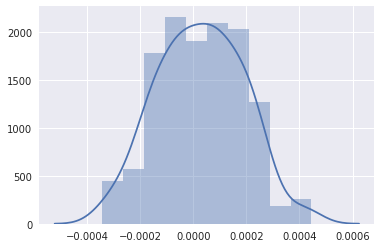

In [35]:
sns.distplot((corr_train.sum(axis=1)-1)/199)

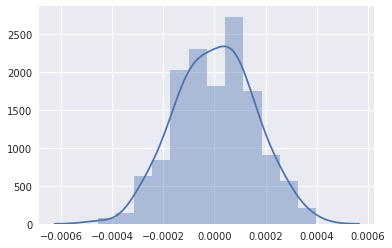

In [17]:
sns.distplot((corr.sum(axis=1)-1)/199)